https://www.openml.org/search?type=data&sort=runs&id=37&status=active

For Each Attribute: (all numeric-valued)

1. preg: Number of times pregnant
2. plas: Plasma glucose concentration a 2 hours in an oral glucose tolerance test
3. pres: Diastolic blood pressure (mm Hg)
4. skin: Triceps skin fold thickness (mm)
5. insu: 2-Hour serum insulin (mu U/ml)
6. mass: Body mass index (weight in kg/(height in m)^2)
7. pedi: Diabetes pedigree function
8. age: Age (years)
9. Outcome: Class variable (positive: True, negative: False)

In [1]:
import pandas as pd
from sklearn.datasets import fetch_openml

# OpenML からデータ取得
diabetes = fetch_openml(name="diabetes", version=1, as_frame=True)
df = diabetes.frame

# フォーマット
df['Outcome'] = (df['class'] == "tested_positive")
df = df.drop('class', axis=1)
df_features = diabetes.data
df_target = df[['Outcome']]

# データの表示
df.head()

,preg,plas,pres,skin,insu,mass,pedi,age,Outcome
0,6,148,72,35,0,33.6,0.627,50,True
1,1,85,66,29,0,26.6,0.351,31,False
2,8,183,64,0,0,23.3,0.672,32,True
3,1,89,66,23,94,28.1,0.167,21,False
4,0,137,40,35,168,43.1,2.288,33,True


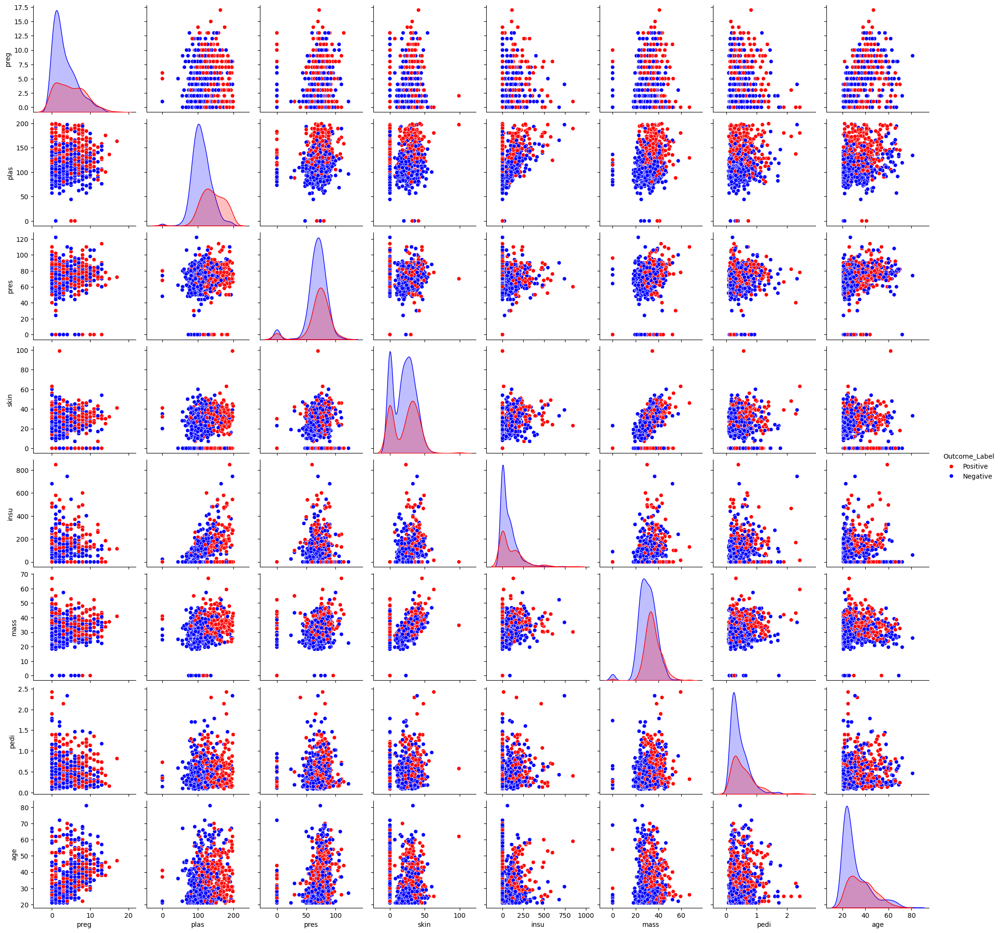

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import fetch_openml

# OpenML からデータ取得
diabetes = fetch_openml(name="diabetes", version=1, as_frame=True)
df = diabetes.frame

# Outcome を boolean に変換
df['Outcome'] = (df['class'] == "tested_positive")
df = df.drop('class', axis=1)

# Outcome 以外の特徴量
df_features = df.drop(columns=['Outcome'])

# Seaborn の hue には列名の文字列を指定する
df['Outcome_Label'] = df["Outcome"].map({True: "Positive", False: "Negative"})  # 新しいラベル列を作成

# 散布図行列の作成
sns.pairplot(df, vars=df_features.columns, hue="Outcome_Label", palette={"Positive": "red", "Negative": "blue"}, diag_kind="kde")
plt.show()

In [1]:
import pandas as pd
from sklearn.datasets import fetch_openml

# OpenML からデータ取得
diabetes = fetch_openml(name="diabetes", version=1, as_frame=True)
df = diabetes.frame

# フォーマット
df['Outcome'] = (df['class'] == "tested_positive")
df = df.drop('class', axis=1)
df_features = diabetes.data
df_target = df[['Outcome']]



def make_binned_features(df_features):
    """特徴量をビン分割して新しい特徴量を作成し、それらを結合して返す。"""
    binned_features = {} 

    for feature in df_features.columns:
        bin_labels, bin_edges = pd.cut(df_features[feature], bins=5, labels=False, retbins=True)
        binned_features[feature] = (bin_labels, bin_edges)

    return binned_features

def make_pair_table(feature_1: pd.Series, feature_2: pd.Series) -> pd.DataFrame:
    """2 つの特徴量に対するクロス集計表を作成して返す。"""
    return pd.crosstab(feature_1, feature_2)


binned_features = make_binned_features(df_features)

for feature_1 in df_features.columns:
    for feature_2 in df_features.columns:
        if feature_1 == feature_2:
            continue
        pair_table = make_pair_table(binned_features[feature_1][0], binned_features[feature_2][0])
        print(f"Feature Pair: {feature_1}, {feature_2}")
        display(pair_table)
        print("----------------------------------\n")

Feature Pair: preg, plas


plas,0,1,2,3,4
preg,,,,,
0,3,23,225,124,49
1,2,5,83,66,19
2,0,7,47,49,32
3,0,1,11,18,0
4,0,0,1,1,2


----------------------------------

Feature Pair: preg, pres


pres,0,1,2,3,4
preg,,,,,
0,22,13,230,152,7
1,6,2,80,82,5
2,6,0,47,77,5
3,2,0,8,18,2
4,0,0,3,1,0


----------------------------------

Feature Pair: preg, skin


skin,0,1,2,3,4
preg,,,,,
0,174,196,51,2,1
1,90,71,14,0,0
2,61,59,15,0,0
3,13,11,6,0,0
4,0,3,1,0,0


----------------------------------

Feature Pair: preg, insu


insu,0,1,2,3,4
preg,,,,,
0,351,57,10,4,2
1,150,22,1,1,1
2,111,17,6,1,0
3,27,3,0,0,0
4,3,1,0,0,0


----------------------------------

Feature Pair: preg, mass


mass,0,1,2,3,4
preg,,,,,
0,6,112,245,57,4
1,2,30,129,14,0
2,3,25,97,10,0
3,0,4,18,8,0
4,0,0,3,1,0


----------------------------------

Feature Pair: preg, pedi


pedi,0,1,2,3,4
preg,,,,,
0,285,109,21,6,3
1,132,35,7,0,1
2,85,40,10,0,0
3,19,9,2,0,0
4,3,1,0,0,0


----------------------------------

Feature Pair: preg, age


age,0,1,2,3,4
preg,,,,,
0,363,36,14,10,1
1,92,47,19,16,1
2,19,73,31,11,1
3,0,18,10,2,0
4,0,2,2,0,0


----------------------------------

Feature Pair: plas, preg


preg,0,1,2,3,4
plas,,,,,
0,3,2,0,0,0
1,23,5,7,1,0
2,225,83,47,11,1
3,124,66,49,18,1
4,49,19,32,0,2


----------------------------------

Feature Pair: plas, pres


pres,0,1,2,3,4
plas,,,,,
0,0,1,2,2,0
1,2,2,20,11,1
2,20,7,206,128,6
3,11,5,98,137,7
4,3,0,42,52,5


----------------------------------

Feature Pair: plas, skin


skin,0,1,2,3,4
plas,,,,,
0,0,4,1,0,0
1,17,15,4,0,0
2,171,162,33,1,0
3,111,111,36,0,0
4,39,48,13,1,1


----------------------------------

Feature Pair: plas, insu


insu,0,1,2,3,4
plas,,,,,
0,5,0,0,0,0
1,36,0,0,0,0
2,339,28,0,0,0
3,196,48,11,3,0
4,66,24,6,3,3


----------------------------------

Feature Pair: plas, mass


mass,0,1,2,3,4
plas,,,,,
0,0,1,3,1,0
1,1,11,22,2,0
2,8,105,224,29,1
3,2,41,176,37,2
4,0,13,67,21,1


----------------------------------

Feature Pair: plas, pedi


pedi,0,1,2,3,4
plas,,,,,
0,4,1,0,0,0
1,27,8,1,0,0
2,260,89,15,3,0
3,175,66,14,2,1
4,58,30,10,1,3


----------------------------------

Feature Pair: plas, age


age,0,1,2,3,4
plas,,,,,
0,3,2,0,0,0
1,22,10,3,1,0
2,271,62,24,9,1
3,136,72,30,18,2
4,42,30,19,11,0


----------------------------------

Feature Pair: pres, preg


preg,0,1,2,3,4
pres,,,,,
0,22,6,6,2,0
1,13,2,0,0,0
2,230,80,47,8,3
3,152,82,77,18,1
4,7,5,5,2,0


----------------------------------

Feature Pair: pres, plas


plas,0,1,2,3,4
pres,,,,,
0,0,2,20,11,3
1,1,2,7,5,0
2,2,20,206,98,42
3,2,11,128,137,52
4,0,1,6,7,5


----------------------------------

Feature Pair: pres, skin


skin,0,1,2,3,4
pres,,,,,
0,34,2,0,0,0
1,5,7,3,0,0
2,149,186,32,0,1
3,143,136,49,2,0
4,7,9,3,0,0


----------------------------------

Feature Pair: pres, insu


insu,0,1,2,3,4
pres,,,,,
0,36,0,0,0,0
1,13,2,0,0,0
2,309,43,11,3,2
3,268,52,6,3,1
4,16,3,0,0,0


----------------------------------

Feature Pair: pres, mass


mass,0,1,2,3,4
pres,,,,,
0,7,7,17,5,0
1,0,5,5,4,1
2,1,110,237,20,0
3,3,47,224,55,1
4,0,2,9,6,2


----------------------------------

Feature Pair: pres, pedi


pedi,0,1,2,3,4
pres,,,,,
0,25,11,0,0,0
1,10,4,0,0,1
2,258,90,15,4,1
3,218,86,22,2,2
4,13,3,3,0,0


----------------------------------

Feature Pair: pres, age


age,0,1,2,3,4
pres,,,,,
0,27,8,0,0,1
1,14,1,0,0,0
2,269,66,22,11,0
3,159,92,50,27,2
4,5,9,4,1,0


----------------------------------

Feature Pair: skin, preg


preg,0,1,2,3,4
skin,,,,,
0,174,90,61,13,0
1,196,71,59,11,3
2,51,14,15,6,1
3,2,0,0,0,0
4,1,0,0,0,0


----------------------------------

Feature Pair: skin, plas


plas,0,1,2,3,4
skin,,,,,
0,0,17,171,111,39
1,4,15,162,111,48
2,1,4,33,36,13
3,0,0,1,0,1
4,0,0,0,0,1


----------------------------------

Feature Pair: skin, pres


pres,0,1,2,3,4
skin,,,,,
0,34,5,149,143,7
1,2,7,186,136,9
2,0,3,32,49,3
3,0,0,0,2,0
4,0,0,1,0,0


----------------------------------

Feature Pair: skin, insu


insu,0,1,2,3,4
skin,,,,,
0,322,13,3,0,0
1,261,64,10,2,3
2,56,23,4,4,0
3,2,0,0,0,0
4,1,0,0,0,0


----------------------------------

Feature Pair: skin, mass


mass,0,1,2,3,4
skin,,,,,
0,9,128,177,24,0
1,2,43,260,34,1
2,0,0,54,31,2
3,0,0,0,1,1
4,0,0,1,0,0


----------------------------------

Feature Pair: skin, pedi


pedi,0,1,2,3,4
skin,,,,,
0,246,78,13,1,0
1,228,85,20,5,2
2,50,29,7,0,1
3,0,1,0,0,1
4,0,1,0,0,0


----------------------------------

Feature Pair: skin, age


age,0,1,2,3,4
skin,,,,,
0,201,75,35,25,2
1,217,77,34,11,1
2,54,24,7,2,0
3,2,0,0,0,0
4,0,0,0,1,0


----------------------------------

Feature Pair: insu, preg


preg,0,1,2,3,4
insu,,,,,
0,351,150,111,27,3
1,57,22,17,3,1
2,10,1,6,0,0
3,4,1,1,0,0
4,2,1,0,0,0


----------------------------------

Feature Pair: insu, plas


plas,0,1,2,3,4
insu,,,,,
0,5,36,339,196,66
1,0,0,28,48,24
2,0,0,0,11,6
3,0,0,0,3,3
4,0,0,0,0,3


----------------------------------

Feature Pair: insu, pres


pres,0,1,2,3,4
insu,,,,,
0,36,13,309,268,16
1,0,2,43,52,3
2,0,0,11,6,0
3,0,0,3,3,0
4,0,0,2,1,0


----------------------------------

Feature Pair: insu, skin


skin,0,1,2,3,4
insu,,,,,
0,322,261,56,2,1
1,13,64,23,0,0
2,3,10,4,0,0
3,0,2,4,0,0
4,0,3,0,0,0


----------------------------------

Feature Pair: insu, mass


mass,0,1,2,3,4
insu,,,,,
0,11,158,404,66,3
1,0,11,70,18,1
2,0,2,12,3,0
3,0,0,4,2,0
4,0,0,2,1,0


----------------------------------

Feature Pair: insu, pedi


pedi,0,1,2,3,4
insu,,,,,
0,457,148,30,5,2
1,52,38,9,1,0
2,10,5,1,0,1
3,3,3,0,0,0
4,2,0,0,0,1


----------------------------------

Feature Pair: insu, age


age,0,1,2,3,4
insu,,,,,
0,399,148,62,30,3
1,60,23,10,7,0
2,10,4,2,1,0
3,3,1,2,0,0
4,2,0,0,1,0


----------------------------------

Feature Pair: mass, preg


preg,0,1,2,3,4
mass,,,,,
0,6,2,3,0,0
1,112,30,25,4,0
2,245,129,97,18,3
3,57,14,10,8,1
4,4,0,0,0,0


----------------------------------

Feature Pair: mass, plas


plas,0,1,2,3,4
mass,,,,,
0,0,1,8,2,0
1,1,11,105,41,13
2,3,22,224,176,67
3,1,2,29,37,21
4,0,0,1,2,1


----------------------------------

Feature Pair: mass, pres


pres,0,1,2,3,4
mass,,,,,
0,7,0,1,3,0
1,7,5,110,47,2
2,17,5,237,224,9
3,5,4,20,55,6
4,0,1,0,1,2


----------------------------------

Feature Pair: mass, skin


skin,0,1,2,3,4
mass,,,,,
0,9,2,0,0,0
1,128,43,0,0,0
2,177,260,54,0,1
3,24,34,31,1,0
4,0,1,2,1,0


----------------------------------

Feature Pair: mass, insu


insu,0,1,2,3,4
mass,,,,,
0,11,0,0,0,0
1,158,11,2,0,0
2,404,70,12,4,2
3,66,18,3,2,1
4,3,1,0,0,0


----------------------------------

Feature Pair: mass, pedi


pedi,0,1,2,3,4
mass,,,,,
0,8,2,0,1,0
1,125,40,5,1,0
2,341,122,25,2,2
3,48,29,10,2,1
4,2,1,0,0,1


----------------------------------

Feature Pair: mass, age


age,0,1,2,3,4
mass,,,,,
0,9,0,1,1,0
1,122,19,15,13,2
2,280,136,51,24,1
3,59,21,9,1,0
4,4,0,0,0,0


----------------------------------

Feature Pair: pedi, preg


preg,0,1,2,3,4
pedi,,,,,
0,285,132,85,19,3
1,109,35,40,9,1
2,21,7,10,2,0
3,6,0,0,0,0
4,3,1,0,0,0


----------------------------------

Feature Pair: pedi, plas


plas,0,1,2,3,4
pedi,,,,,
0,4,27,260,175,58
1,1,8,89,66,30
2,0,1,15,14,10
3,0,0,3,2,1
4,0,0,0,1,3


----------------------------------

Feature Pair: pedi, pres


pres,0,1,2,3,4
pedi,,,,,
0,25,10,258,218,13
1,11,4,90,86,3
2,0,0,15,22,3
3,0,0,4,2,0
4,0,1,1,2,0


----------------------------------

Feature Pair: pedi, skin


skin,0,1,2,3,4
pedi,,,,,
0,246,228,50,0,0
1,78,85,29,1,1
2,13,20,7,0,0
3,1,5,0,0,0
4,0,2,1,1,0


----------------------------------

Feature Pair: pedi, insu


insu,0,1,2,3,4
pedi,,,,,
0,457,52,10,3,2
1,148,38,5,3,0
2,30,9,1,0,0
3,5,1,0,0,0
4,2,0,1,0,1


----------------------------------

Feature Pair: pedi, mass


mass,0,1,2,3,4
pedi,,,,,
0,8,125,341,48,2
1,2,40,122,29,1
2,0,5,25,10,0
3,1,1,2,2,0
4,0,0,2,1,1


----------------------------------

Feature Pair: pedi, age


age,0,1,2,3,4
pedi,,,,,
0,332,119,45,26,2
1,115,43,23,12,1
2,18,13,8,1,0
3,5,1,0,0,0
4,4,0,0,0,0


----------------------------------

Feature Pair: age, preg


preg,0,1,2,3,4
age,,,,,
0,363,92,19,0,0
1,36,47,73,18,2
2,14,19,31,10,2
3,10,16,11,2,0
4,1,1,1,0,0


----------------------------------

Feature Pair: age, plas


plas,0,1,2,3,4
age,,,,,
0,3,22,271,136,42
1,2,10,62,72,30
2,0,3,24,30,19
3,0,1,9,18,11
4,0,0,1,2,0


----------------------------------

Feature Pair: age, pres


pres,0,1,2,3,4
age,,,,,
0,27,14,269,159,5
1,8,1,66,92,9
2,0,0,22,50,4
3,0,0,11,27,1
4,1,0,0,2,0


----------------------------------

Feature Pair: age, skin


skin,0,1,2,3,4
age,,,,,
0,201,217,54,2,0
1,75,77,24,0,0
2,35,34,7,0,0
3,25,11,2,0,1
4,2,1,0,0,0


----------------------------------

Feature Pair: age, insu


insu,0,1,2,3,4
age,,,,,
0,399,60,10,3,2
1,148,23,4,1,0
2,62,10,2,2,0
3,30,7,1,0,1
4,3,0,0,0,0


----------------------------------

Feature Pair: age, mass


mass,0,1,2,3,4
age,,,,,
0,9,122,280,59,4
1,0,19,136,21,0
2,1,15,51,9,0
3,1,13,24,1,0
4,0,2,1,0,0


----------------------------------

Feature Pair: age, pedi


pedi,0,1,2,3,4
age,,,,,
0,332,115,18,5,4
1,119,43,13,1,0
2,45,23,8,0,0
3,26,12,1,0,0
4,2,1,0,0,0


----------------------------------



In [25]:
import pandas as pd
import numpy as np
from sklearn.datasets import fetch_openml
from itertools import combinations

# OpenML からデータ取得
diabetes = fetch_openml(name="diabetes", version=1, as_frame=True)
df = diabetes.frame

# フォーマット
df['Outcome'] = (df['class'] == "tested_positive")
df = df.drop('class', axis=1)
df_features = diabetes.data
df_target = df[['Outcome']]

# 特徴量をビン分割して、Outcomeと組み合わせたデータフレームを作成
def create_binned_dataframe(df_features, df_target):
    """特徴量をビン分割し、Outcomeと一緒にデータフレームとして返す"""
    binned_df = pd.DataFrame(index=df_features.index)
    
    for feature in df_features.columns:
        binned_df[feature] = pd.cut(df_features[feature], bins=5, labels=False)
    
    binned_df['Outcome'] = df_target['Outcome'].values
    
    return binned_df

# 全てのビンを含むクロス集計表を作成する関数
def complete_crosstab(series1, series2):
    """欠けているビンを0埋めしたクロス集計表を作成する"""
    # クロス集計表を作成
    crosstab = pd.crosstab(series1, series2)
    
    # 0-4の全てのインデックスとカラムを確保
    all_bins = list(range(5))  # 5つのビンなので0-4
    
    # 欠けているインデックスを追加
    missing_indices = set(all_bins) - set(crosstab.index)
    for idx in missing_indices:
        crosstab.loc[idx] = 0
    
    # 欠けているカラムを追加
    missing_columns = set(all_bins) - set(crosstab.columns)
    for col in missing_columns:
        crosstab[col] = 0
    
    # インデックスとカラムを整列
    crosstab = crosstab.reindex(index=all_bins, columns=all_bins, fill_value=0)
    
    return crosstab

# ビン分割したデータフレームを作成
binned_df = create_binned_dataframe(df_features, df_target)

# 重複のない特徴量ペアの組み合わせを生成
feature_pairs = list(combinations(df_features.columns, 2))

# 各特徴量ペアについて、全体とOutcome別にクロス集計表を作成
for feature_1, feature_2 in feature_pairs:
    print(f"Feature Pair: {feature_1}, {feature_2}")
    
    # 全体の集計表（0埋め）
    pair_table_all = complete_crosstab(binned_df[feature_1], binned_df[feature_2])
    print("全データ:")
    display(pair_table_all)
    
    # Outcome = True (陽性)のみの集計表
    diabetic_df = binned_df[binned_df['Outcome'] == True]
    pair_table_true = complete_crosstab(diabetic_df[feature_1], diabetic_df[feature_2])
    
    # 陽性率の計算 (陽性数 ÷ 全体数)
    positive_rate = pair_table_true / pair_table_all
    positive_rate = positive_rate.fillna(0)  # ゼロ除算による NaN を 0 に置き換え
    positive_rate = positive_rate.map(lambda x: f"{x:.2f}")  # 小数点以下2桁に整形
    
    print("陽性率:")
    display(positive_rate)
    
    # # Outcome = True (陽性)
    # print("Outcome = True (陽性):")
    # display(pair_table_true)
    
    # # Outcome = False (陰性)
    # non_diabetic_df = binned_df[binned_df['Outcome'] == False]
    # pair_table_false = complete_crosstab(non_diabetic_df[feature_1], non_diabetic_df[feature_2])
    # print("Outcome = False (陰性):")
    # display(pair_table_false)

    print("----------------------------------\n")

Feature Pair: preg, plas
全データ:


plas,0,1,2,3,4
preg,,,,,
0,3,23,225,124,49
1,2,5,83,66,19
2,0,7,47,49,32
3,0,1,11,18,0
4,0,0,1,1,2


陽性率:


plas,0,1,2,3,4
preg,,,,,
0,0.00,0.04,0.11,0.38,0.82
1,1.00,0.00,0.19,0.42,0.74
2,0.00,0.00,0.45,0.53,0.88
3,0.00,0.00,0.36,0.67,0.00
4,0.00,0.00,1.00,1.00,1.00


----------------------------------

Feature Pair: preg, pres
全データ:


pres,0,1,2,3,4
preg,,,,,
0,22,13,230,152,7
1,6,2,80,82,5
2,6,0,47,77,5
3,2,0,8,18,2
4,0,0,3,1,0


陽性率:


pres,0,1,2,3,4
preg,,,,,
0,0.41,0.23,0.21,0.32,0.57
1,0.33,0.00,0.31,0.37,0.60
2,0.50,0.00,0.53,0.57,0.60
3,1.00,0.00,0.50,0.50,0.50
4,0.00,0.00,1.00,1.00,0.00


----------------------------------

Feature Pair: preg, skin
全データ:


skin,0,1,2,3,4
preg,,,,,
0,174,196,51,2,1
1,90,71,14,0,0
2,61,59,15,0,0
3,13,11,6,0,0
4,0,3,1,0,0


陽性率:


skin,0,1,2,3,4
preg,,,,,
0,0.19,0.29,0.43,0.50,1.00
1,0.41,0.24,0.43,0.00,0.00
2,0.46,0.66,0.53,0.00,0.00
3,0.38,0.73,0.50,0.00,0.00
4,0.00,1.00,1.00,0.00,0.00


----------------------------------

Feature Pair: preg, insu
全データ:


insu,0,1,2,3,4
preg,,,,,
0,351,57,10,4,2
1,150,22,1,1,1
2,111,17,6,1,0
3,27,3,0,0,0
4,3,1,0,0,0


陽性率:


insu,0,1,2,3,4
preg,,,,,
0,0.23,0.40,0.40,1.00,0.50
1,0.33,0.41,1.00,0.00,0.00
2,0.50,0.82,0.67,1.00,0.00
3,0.48,1.00,0.00,0.00,0.00
4,1.00,1.00,0.00,0.00,0.00


----------------------------------

Feature Pair: preg, mass
全データ:


mass,0,1,2,3,4
preg,,,,,
0,6,112,245,57,4
1,2,30,129,14,0
2,3,25,97,10,0
3,0,4,18,8,0
4,0,0,3,1,0


陽性率:


mass,0,1,2,3,4
preg,,,,,
0,0.00,0.04,0.32,0.46,0.75
1,0.00,0.13,0.36,0.64,0.00
2,0.67,0.24,0.60,0.90,0.00
3,0.00,0.25,0.50,0.75,0.00
4,0.00,0.00,1.00,1.00,0.00


----------------------------------

Feature Pair: preg, pedi
全データ:


pedi,0,1,2,3,4
preg,,,,,
0,285,109,21,6,3
1,132,35,7,0,1
2,85,40,10,0,0
3,19,9,2,0,0
4,3,1,0,0,0


陽性率:


pedi,0,1,2,3,4
preg,,,,,
0,0.23,0.31,0.48,0.17,1.00
1,0.32,0.34,0.86,0.00,0.00
2,0.49,0.65,0.70,0.00,0.00
3,0.32,1.00,0.50,0.00,0.00
4,1.00,1.00,0.00,0.00,0.00


----------------------------------

Feature Pair: preg, age
全データ:


age,0,1,2,3,4
preg,,,,,
0,363,36,14,10,1
1,92,47,19,16,1
2,19,73,31,11,1
3,0,18,10,2,0
4,0,2,2,0,0


陽性率:


age,0,1,2,3,4
preg,,,,,
0,0.23,0.50,0.50,0.40,0.00
1,0.26,0.36,0.63,0.38,1.00
2,0.74,0.56,0.58,0.18,0.00
3,0.00,0.56,0.50,0.50,0.00
4,0.00,1.00,1.00,0.00,0.00


----------------------------------

Feature Pair: plas, pres
全データ:


pres,0,1,2,3,4
plas,,,,,
0,0,1,2,2,0
1,2,2,20,11,1
2,20,7,206,128,6
3,11,5,98,137,7
4,3,0,42,52,5


陽性率:


pres,0,1,2,3,4
plas,,,,,
0,0.00,0.00,0.50,0.50,0.00
1,0.00,0.00,0.05,0.00,0.00
2,0.15,0.14,0.13,0.27,0.33
3,0.91,0.40,0.43,0.40,0.71
4,1.00,0.00,0.83,0.81,0.80


----------------------------------

Feature Pair: plas, skin
全データ:


skin,0,1,2,3,4
plas,,,,,
0,0,4,1,0,0
1,17,15,4,0,0
2,171,162,33,1,0
3,111,111,36,0,0
4,39,48,13,1,1


陽性率:


skin,0,1,2,3,4
plas,,,,,
0,0.00,0.25,1.00,0.00,0.00
1,0.00,0.07,0.00,0.00,0.00
2,0.14,0.21,0.27,0.00,0.00
3,0.44,0.41,0.53,0.00,0.00
4,0.77,0.85,0.85,1.00,1.00


----------------------------------

Feature Pair: plas, insu
全データ:


insu,0,1,2,3,4
plas,,,,,
0,5,0,0,0,0
1,36,0,0,0,0
2,339,28,0,0,0
3,196,48,11,3,0
4,66,24,6,3,3


陽性率:


insu,0,1,2,3,4
plas,,,,,
0,0.40,0.00,0.00,0.00,0.00
1,0.03,0.00,0.00,0.00,0.00
2,0.17,0.36,0.00,0.00,0.00
3,0.46,0.38,0.36,0.67,0.00
4,0.80,0.92,0.83,1.00,0.33


----------------------------------

Feature Pair: plas, mass
全データ:


mass,0,1,2,3,4
plas,,,,,
0,0,1,3,1,0
1,1,11,22,2,0
2,8,105,224,29,1
3,2,41,176,37,2
4,0,13,67,21,1


陽性率:


mass,0,1,2,3,4
plas,,,,,
0,0.00,0.00,0.33,1.00,0.00
1,0.00,0.00,0.05,0.00,0.00
2,0.12,0.02,0.24,0.31,1.00
3,0.50,0.15,0.47,0.65,0.50
4,0.00,0.62,0.87,0.81,1.00


----------------------------------

Feature Pair: plas, pedi
全データ:


pedi,0,1,2,3,4
plas,,,,,
0,4,1,0,0,0
1,27,8,1,0,0
2,260,89,15,3,0
3,175,66,14,2,1
4,58,30,10,1,3


陽性率:


pedi,0,1,2,3,4
plas,,,,,
0,0.25,1.00,0.00,0.00,0.00
1,0.04,0.00,0.00,0.00,0.00
2,0.15,0.25,0.47,0.00,0.00
3,0.41,0.50,0.64,0.00,1.00
4,0.81,0.87,0.80,1.00,0.67


----------------------------------

Feature Pair: plas, age
全データ:


age,0,1,2,3,4
plas,,,,,
0,3,2,0,0,0
1,22,10,3,1,0
2,271,62,24,9,1
3,136,72,30,18,2
4,42,30,19,11,0


陽性率:


age,0,1,2,3,4
plas,,,,,
0,0.00,1.00,0.00,0.00,0.00
1,0.05,0.00,0.00,0.00,0.00
2,0.13,0.35,0.38,0.11,0.00
3,0.37,0.53,0.63,0.33,0.50
4,0.86,0.87,0.84,0.55,0.00


----------------------------------

Feature Pair: pres, skin
全データ:


skin,0,1,2,3,4
pres,,,,,
0,34,2,0,0,0
1,5,7,3,0,0
2,149,186,32,0,1
3,143,136,49,2,0
4,7,9,3,0,0


陽性率:


skin,0,1,2,3,4
pres,,,,,
0,0.44,0.50,0.00,0.00,0.00
1,0.00,0.14,0.67,0.00,0.00
2,0.25,0.29,0.44,0.00,1.00
3,0.33,0.46,0.43,0.50,0.00
4,0.57,0.44,1.00,0.00,0.00


----------------------------------

Feature Pair: pres, insu
全データ:


insu,0,1,2,3,4
pres,,,,,
0,36,0,0,0,0
1,13,2,0,0,0
2,309,43,11,3,2
3,268,52,6,3,1
4,16,3,0,0,0


陽性率:


insu,0,1,2,3,4
pres,,,,,
0,0.44,0.00,0.00,0.00,0.00
1,0.15,0.50,0.00,0.00,0.00
2,0.25,0.44,0.45,1.00,0.50
3,0.37,0.54,0.67,0.67,0.00
4,0.56,0.67,0.00,0.00,0.00


----------------------------------

Feature Pair: pres, mass
全データ:


mass,0,1,2,3,4
pres,,,,,
0,7,7,17,5,0
1,0,5,5,4,1
2,1,110,237,20,0
3,3,47,224,55,1
4,0,2,9,6,2


陽性率:


mass,0,1,2,3,4
pres,,,,,
0,0.14,0.00,0.59,1.00,0.00
1,0.00,0.00,0.00,0.50,1.00
2,0.00,0.09,0.37,0.45,0.00
3,0.33,0.13,0.42,0.55,1.00
4,0.00,0.00,0.56,0.83,0.50


----------------------------------

Feature Pair: pres, pedi
全データ:


pedi,0,1,2,3,4
pres,,,,,
0,25,11,0,0,0
1,10,4,0,0,1
2,258,90,15,4,1
3,218,86,22,2,2
4,13,3,3,0,0


陽性率:


pedi,0,1,2,3,4
pres,,,,,
0,0.40,0.55,0.00,0.00,0.00
1,0.10,0.25,0.00,0.00,1.00
2,0.26,0.32,0.53,0.25,0.00
3,0.32,0.52,0.68,0.00,1.00
4,0.69,0.33,0.33,0.00,0.00


----------------------------------

Feature Pair: pres, age
全データ:


age,0,1,2,3,4
pres,,,,,
0,27,8,0,0,1
1,14,1,0,0,0
2,269,66,22,11,0
3,159,92,50,27,2
4,5,9,4,1,0


陽性率:


age,0,1,2,3,4
pres,,,,,
0,0.41,0.62,0.00,0.00,0.00
1,0.21,0.00,0.00,0.00,0.00
2,0.21,0.50,0.59,0.36,0.00
3,0.31,0.48,0.58,0.33,0.50
4,0.60,0.67,0.50,0.00,0.00


----------------------------------

Feature Pair: skin, insu
全データ:


insu,0,1,2,3,4
skin,,,,,
0,322,13,3,0,0
1,261,64,10,2,3
2,56,23,4,4,0
3,2,0,0,0,0
4,1,0,0,0,0


陽性率:


insu,0,1,2,3,4
skin,,,,,
0,0.31,0.31,0.00,0.00,0.00
1,0.31,0.48,0.80,1.00,0.33
2,0.38,0.65,0.25,0.75,0.00
3,0.50,0.00,0.00,0.00,0.00
4,1.00,0.00,0.00,0.00,0.00


----------------------------------

Feature Pair: skin, mass
全データ:


mass,0,1,2,3,4
skin,,,,,
0,9,128,177,24,0
1,2,43,260,34,1
2,0,0,54,31,2
3,0,0,0,1,1
4,0,0,1,0,0


陽性率:


mass,0,1,2,3,4
skin,,,,,
0,0.22,0.09,0.42,0.62,0.00
1,0.00,0.12,0.37,0.62,0.00
2,0.00,0.00,0.43,0.48,1.00
3,0.00,0.00,0.00,0.00,1.00
4,0.00,0.00,1.00,0.00,0.00


----------------------------------

Feature Pair: skin, pedi
全データ:


pedi,0,1,2,3,4
skin,,,,,
0,246,78,13,1,0
1,228,85,20,5,2
2,50,29,7,0,1
3,0,1,0,0,1
4,0,1,0,0,0


陽性率:


pedi,0,1,2,3,4
skin,,,,,
0,0.30,0.29,0.54,0.00,0.00
1,0.29,0.48,0.65,0.20,0.50
2,0.36,0.59,0.57,0.00,1.00
3,0.00,0.00,0.00,0.00,1.00
4,0.00,1.00,0.00,0.00,0.00


----------------------------------

Feature Pair: skin, age
全データ:


age,0,1,2,3,4
skin,,,,,
0,201,75,35,25,2
1,217,77,34,11,1
2,54,24,7,2,0
3,2,0,0,0,0
4,0,0,0,1,0


陽性率:


age,0,1,2,3,4
skin,,,,,
0,0.22,0.48,0.40,0.28,0.50
1,0.24,0.53,0.74,0.36,0.00
2,0.43,0.46,0.71,0.50,0.00
3,0.50,0.00,0.00,0.00,0.00
4,0.00,0.00,0.00,1.00,0.00


----------------------------------

Feature Pair: insu, mass
全データ:


mass,0,1,2,3,4
insu,,,,,
0,11,158,404,66,3
1,0,11,70,18,1
2,0,2,12,3,0
3,0,0,4,2,0
4,0,0,2,1,0


陽性率:


mass,0,1,2,3,4
insu,,,,,
0,0.18,0.09,0.36,0.55,1.00
1,0.00,0.09,0.53,0.67,0.00
2,0.00,0.00,0.67,0.33,0.00
3,0.00,0.00,0.75,1.00,0.00
4,0.00,0.00,0.50,0.00,0.00


----------------------------------

Feature Pair: insu, pedi
全データ:


pedi,0,1,2,3,4
insu,,,,,
0,457,148,30,5,2
1,52,38,9,1,0
2,10,5,1,0,1
3,3,3,0,0,0
4,2,0,0,0,1


陽性率:


pedi,0,1,2,3,4
insu,,,,,
0,0.28,0.37,0.57,0.20,1.00
1,0.40,0.61,0.67,0.00,0.00
2,0.50,0.40,1.00,0.00,1.00
3,1.00,0.67,0.00,0.00,0.00
4,0.50,0.00,0.00,0.00,0.00


----------------------------------

Feature Pair: insu, age
全データ:


age,0,1,2,3,4
insu,,,,,
0,399,148,62,30,3
1,60,23,10,7,0
2,10,4,2,1,0
3,3,1,2,0,0
4,2,0,0,1,0


陽性率:


age,0,1,2,3,4
insu,,,,,
0,0.23,0.48,0.50,0.27,0.33
1,0.38,0.65,0.90,0.43,0.00
2,0.40,0.50,1.00,1.00,0.00
3,1.00,0.00,1.00,0.00,0.00
4,0.00,0.00,0.00,1.00,0.00


----------------------------------

Feature Pair: mass, pedi
全データ:


pedi,0,1,2,3,4
mass,,,,,
0,8,2,0,1,0
1,125,40,5,1,0
2,341,122,25,2,2
3,48,29,10,2,1
4,2,1,0,0,1


陽性率:


pedi,0,1,2,3,4
mass,,,,,
0,0.25,0.00,0.00,0.00,0.00
1,0.09,0.10,0.20,0.00,0.00
2,0.34,0.49,0.76,0.00,0.50
3,0.56,0.62,0.40,0.50,1.00
4,1.00,0.00,0.00,0.00,1.00


----------------------------------

Feature Pair: mass, age
全データ:


age,0,1,2,3,4
mass,,,,,
0,9,0,1,1,0
1,122,19,15,13,2
2,280,136,51,24,1
3,59,21,9,1,0
4,4,0,0,0,0


陽性率:


age,0,1,2,3,4
mass,,,,,
0,0.11,0.00,1.00,0.00,0.00
1,0.06,0.11,0.33,0.15,0.00
2,0.29,0.52,0.63,0.46,1.00
3,0.51,0.71,0.67,0.00,0.00
4,0.75,0.00,0.00,0.00,0.00


----------------------------------

Feature Pair: pedi, age
全データ:


age,0,1,2,3,4
pedi,,,,,
0,332,119,45,26,2
1,115,43,23,12,1
2,18,13,8,1,0
3,5,1,0,0,0
4,4,0,0,0,0


陽性率:


age,0,1,2,3,4
pedi,,,,,
0,0.20,0.49,0.49,0.35,0.50
1,0.33,0.56,0.70,0.33,0.00
2,0.67,0.46,0.75,0.00,0.00
3,0.20,0.00,0.00,0.00,0.00
4,0.75,0.00,0.00,0.00,0.00


----------------------------------



In [28]:
import pandas as pd
import numpy as np
from sklearn.datasets import fetch_openml
from itertools import combinations

# OpenML からデータ取得
diabetes = fetch_openml(name="diabetes", version=1, as_frame=True)
df = diabetes.frame

# フォーマット
df['Outcome'] = (df['class'] == "tested_positive")
df = df.drop('class', axis=1)
df_features = diabetes.data
df_target = df[['Outcome']]

# 特徴量をビン分割して、Outcomeと組み合わせたデータフレームを作成
def create_binned_dataframe(df_features, df_target):
    """特徴量をビン分割し、Outcomeと一緒にデータフレームとして返す"""
    binned_df = pd.DataFrame(index=df_features.index)
    
    for feature in df_features.columns:
        binned_df[feature] = pd.cut(df_features[feature], bins=5, labels=False)
    
    binned_df['Outcome'] = df_target['Outcome'].values
    
    return binned_df

# 全てのビンを含むクロス集計表を作成する関数
def complete_crosstab(series1, series2):
    """欠けているビンを0埋めしたクロス集計表を作成する"""
    # クロス集計表を作成
    crosstab = pd.crosstab(series1, series2)
    
    # 0-4の全てのインデックスとカラムを確保
    all_bins = list(range(5))  # 5つのビンなので0-4
    
    # 欠けているインデックスを追加
    missing_indices = set(all_bins) - set(crosstab.index)
    for idx in missing_indices:
        crosstab.loc[idx] = 0
    
    # 欠けているカラムを追加
    missing_columns = set(all_bins) - set(crosstab.columns)
    for col in missing_columns:
        crosstab[col] = 0
    
    # インデックスとカラムを整列
    crosstab = crosstab.reindex(index=all_bins, columns=all_bins, fill_value=0)
    
    return crosstab

# ビン分割したデータフレームを作成
binned_df = create_binned_dataframe(df_features, df_target)

# 重複のない特徴量ペアの組み合わせを生成
feature_pairs = list(combinations(df_features.columns, 2))

# 各特徴量ペアについて、全体とOutcome別にクロス集計表を作成
for feature_1, feature_2 in feature_pairs:
    print(f"Feature Pair: {feature_1}, {feature_2}")
    
    # 全体の集計表（0埋め）
    pair_table_all = complete_crosstab(binned_df[feature_1], binned_df[feature_2])
    print("全データ:")
    display(pair_table_all)
    
    # カウント0のエントリを抽出
    zero_entries = []
    for row in pair_table_all.index:
        for col in pair_table_all.columns:
            if pair_table_all.loc[row, col] == 0:
                zero_entries.append(f"{feature_1}={row},{feature_2}={col}")
    
    print("カウント0のエントリ:")
    if zero_entries:
        for entry in zero_entries:
            print(entry)
    else:
        print("なし")
    
    # Outcome = True (陽性)のみの集計表
    diabetic_df = binned_df[binned_df['Outcome'] == True]
    pair_table_true = complete_crosstab(diabetic_df[feature_1], diabetic_df[feature_2])
    
    # 陽性率の計算 (陽性数 ÷ 全体数)
    positive_rate = pair_table_true / pair_table_all
    positive_rate = positive_rate.fillna(0)  # ゼロ除算による NaN を 0 に置き換え
    positive_rate = positive_rate.map(lambda x: f"{x:.2f}")  # 小数点以下2桁に整形
    
    print("陽性率:")
    display(positive_rate)

    print("----------------------------------\n")

Feature Pair: preg, plas
全データ:


plas,0,1,2,3,4
preg,,,,,
0,3,23,225,124,49
1,2,5,83,66,19
2,0,7,47,49,32
3,0,1,11,18,0
4,0,0,1,1,2


カウント0のエントリ:
preg=2,plas=0
preg=3,plas=0
preg=3,plas=4
preg=4,plas=0
preg=4,plas=1
陽性率:


plas,0,1,2,3,4
preg,,,,,
0,0.00,0.04,0.11,0.38,0.82
1,1.00,0.00,0.19,0.42,0.74
2,0.00,0.00,0.45,0.53,0.88
3,0.00,0.00,0.36,0.67,0.00
4,0.00,0.00,1.00,1.00,1.00


----------------------------------

Feature Pair: preg, pres
全データ:


pres,0,1,2,3,4
preg,,,,,
0,22,13,230,152,7
1,6,2,80,82,5
2,6,0,47,77,5
3,2,0,8,18,2
4,0,0,3,1,0


カウント0のエントリ:
preg=2,pres=1
preg=3,pres=1
preg=4,pres=0
preg=4,pres=1
preg=4,pres=4
陽性率:


pres,0,1,2,3,4
preg,,,,,
0,0.41,0.23,0.21,0.32,0.57
1,0.33,0.00,0.31,0.37,0.60
2,0.50,0.00,0.53,0.57,0.60
3,1.00,0.00,0.50,0.50,0.50
4,0.00,0.00,1.00,1.00,0.00


----------------------------------

Feature Pair: preg, skin
全データ:


skin,0,1,2,3,4
preg,,,,,
0,174,196,51,2,1
1,90,71,14,0,0
2,61,59,15,0,0
3,13,11,6,0,0
4,0,3,1,0,0


カウント0のエントリ:
preg=1,skin=3
preg=1,skin=4
preg=2,skin=3
preg=2,skin=4
preg=3,skin=3
preg=3,skin=4
preg=4,skin=0
preg=4,skin=3
preg=4,skin=4
陽性率:


skin,0,1,2,3,4
preg,,,,,
0,0.19,0.29,0.43,0.50,1.00
1,0.41,0.24,0.43,0.00,0.00
2,0.46,0.66,0.53,0.00,0.00
3,0.38,0.73,0.50,0.00,0.00
4,0.00,1.00,1.00,0.00,0.00


----------------------------------

Feature Pair: preg, insu
全データ:


insu,0,1,2,3,4
preg,,,,,
0,351,57,10,4,2
1,150,22,1,1,1
2,111,17,6,1,0
3,27,3,0,0,0
4,3,1,0,0,0


カウント0のエントリ:
preg=2,insu=4
preg=3,insu=2
preg=3,insu=3
preg=3,insu=4
preg=4,insu=2
preg=4,insu=3
preg=4,insu=4
陽性率:


insu,0,1,2,3,4
preg,,,,,
0,0.23,0.40,0.40,1.00,0.50
1,0.33,0.41,1.00,0.00,0.00
2,0.50,0.82,0.67,1.00,0.00
3,0.48,1.00,0.00,0.00,0.00
4,1.00,1.00,0.00,0.00,0.00


----------------------------------

Feature Pair: preg, mass
全データ:


mass,0,1,2,3,4
preg,,,,,
0,6,112,245,57,4
1,2,30,129,14,0
2,3,25,97,10,0
3,0,4,18,8,0
4,0,0,3,1,0


カウント0のエントリ:
preg=1,mass=4
preg=2,mass=4
preg=3,mass=0
preg=3,mass=4
preg=4,mass=0
preg=4,mass=1
preg=4,mass=4
陽性率:


mass,0,1,2,3,4
preg,,,,,
0,0.00,0.04,0.32,0.46,0.75
1,0.00,0.13,0.36,0.64,0.00
2,0.67,0.24,0.60,0.90,0.00
3,0.00,0.25,0.50,0.75,0.00
4,0.00,0.00,1.00,1.00,0.00


----------------------------------

Feature Pair: preg, pedi
全データ:


pedi,0,1,2,3,4
preg,,,,,
0,285,109,21,6,3
1,132,35,7,0,1
2,85,40,10,0,0
3,19,9,2,0,0
4,3,1,0,0,0


カウント0のエントリ:
preg=1,pedi=3
preg=2,pedi=3
preg=2,pedi=4
preg=3,pedi=3
preg=3,pedi=4
preg=4,pedi=2
preg=4,pedi=3
preg=4,pedi=4
陽性率:


pedi,0,1,2,3,4
preg,,,,,
0,0.23,0.31,0.48,0.17,1.00
1,0.32,0.34,0.86,0.00,0.00
2,0.49,0.65,0.70,0.00,0.00
3,0.32,1.00,0.50,0.00,0.00
4,1.00,1.00,0.00,0.00,0.00


----------------------------------

Feature Pair: preg, age
全データ:


age,0,1,2,3,4
preg,,,,,
0,363,36,14,10,1
1,92,47,19,16,1
2,19,73,31,11,1
3,0,18,10,2,0
4,0,2,2,0,0


カウント0のエントリ:
preg=3,age=0
preg=3,age=4
preg=4,age=0
preg=4,age=3
preg=4,age=4
陽性率:


age,0,1,2,3,4
preg,,,,,
0,0.23,0.50,0.50,0.40,0.00
1,0.26,0.36,0.63,0.38,1.00
2,0.74,0.56,0.58,0.18,0.00
3,0.00,0.56,0.50,0.50,0.00
4,0.00,1.00,1.00,0.00,0.00


----------------------------------

Feature Pair: plas, pres
全データ:


pres,0,1,2,3,4
plas,,,,,
0,0,1,2,2,0
1,2,2,20,11,1
2,20,7,206,128,6
3,11,5,98,137,7
4,3,0,42,52,5


カウント0のエントリ:
plas=0,pres=0
plas=0,pres=4
plas=4,pres=1
陽性率:


pres,0,1,2,3,4
plas,,,,,
0,0.00,0.00,0.50,0.50,0.00
1,0.00,0.00,0.05,0.00,0.00
2,0.15,0.14,0.13,0.27,0.33
3,0.91,0.40,0.43,0.40,0.71
4,1.00,0.00,0.83,0.81,0.80


----------------------------------

Feature Pair: plas, skin
全データ:


skin,0,1,2,3,4
plas,,,,,
0,0,4,1,0,0
1,17,15,4,0,0
2,171,162,33,1,0
3,111,111,36,0,0
4,39,48,13,1,1


カウント0のエントリ:
plas=0,skin=0
plas=0,skin=3
plas=0,skin=4
plas=1,skin=3
plas=1,skin=4
plas=2,skin=4
plas=3,skin=3
plas=3,skin=4
陽性率:


skin,0,1,2,3,4
plas,,,,,
0,0.00,0.25,1.00,0.00,0.00
1,0.00,0.07,0.00,0.00,0.00
2,0.14,0.21,0.27,0.00,0.00
3,0.44,0.41,0.53,0.00,0.00
4,0.77,0.85,0.85,1.00,1.00


----------------------------------

Feature Pair: plas, insu
全データ:


insu,0,1,2,3,4
plas,,,,,
0,5,0,0,0,0
1,36,0,0,0,0
2,339,28,0,0,0
3,196,48,11,3,0
4,66,24,6,3,3


カウント0のエントリ:
plas=0,insu=1
plas=0,insu=2
plas=0,insu=3
plas=0,insu=4
plas=1,insu=1
plas=1,insu=2
plas=1,insu=3
plas=1,insu=4
plas=2,insu=2
plas=2,insu=3
plas=2,insu=4
plas=3,insu=4
陽性率:


insu,0,1,2,3,4
plas,,,,,
0,0.40,0.00,0.00,0.00,0.00
1,0.03,0.00,0.00,0.00,0.00
2,0.17,0.36,0.00,0.00,0.00
3,0.46,0.38,0.36,0.67,0.00
4,0.80,0.92,0.83,1.00,0.33


----------------------------------

Feature Pair: plas, mass
全データ:


mass,0,1,2,3,4
plas,,,,,
0,0,1,3,1,0
1,1,11,22,2,0
2,8,105,224,29,1
3,2,41,176,37,2
4,0,13,67,21,1


カウント0のエントリ:
plas=0,mass=0
plas=0,mass=4
plas=1,mass=4
plas=4,mass=0
陽性率:


mass,0,1,2,3,4
plas,,,,,
0,0.00,0.00,0.33,1.00,0.00
1,0.00,0.00,0.05,0.00,0.00
2,0.12,0.02,0.24,0.31,1.00
3,0.50,0.15,0.47,0.65,0.50
4,0.00,0.62,0.87,0.81,1.00


----------------------------------

Feature Pair: plas, pedi
全データ:


pedi,0,1,2,3,4
plas,,,,,
0,4,1,0,0,0
1,27,8,1,0,0
2,260,89,15,3,0
3,175,66,14,2,1
4,58,30,10,1,3


カウント0のエントリ:
plas=0,pedi=2
plas=0,pedi=3
plas=0,pedi=4
plas=1,pedi=3
plas=1,pedi=4
plas=2,pedi=4
陽性率:


pedi,0,1,2,3,4
plas,,,,,
0,0.25,1.00,0.00,0.00,0.00
1,0.04,0.00,0.00,0.00,0.00
2,0.15,0.25,0.47,0.00,0.00
3,0.41,0.50,0.64,0.00,1.00
4,0.81,0.87,0.80,1.00,0.67


----------------------------------

Feature Pair: plas, age
全データ:


age,0,1,2,3,4
plas,,,,,
0,3,2,0,0,0
1,22,10,3,1,0
2,271,62,24,9,1
3,136,72,30,18,2
4,42,30,19,11,0


カウント0のエントリ:
plas=0,age=2
plas=0,age=3
plas=0,age=4
plas=1,age=4
plas=4,age=4
陽性率:


age,0,1,2,3,4
plas,,,,,
0,0.00,1.00,0.00,0.00,0.00
1,0.05,0.00,0.00,0.00,0.00
2,0.13,0.35,0.38,0.11,0.00
3,0.37,0.53,0.63,0.33,0.50
4,0.86,0.87,0.84,0.55,0.00


----------------------------------

Feature Pair: pres, skin
全データ:


skin,0,1,2,3,4
pres,,,,,
0,34,2,0,0,0
1,5,7,3,0,0
2,149,186,32,0,1
3,143,136,49,2,0
4,7,9,3,0,0


カウント0のエントリ:
pres=0,skin=2
pres=0,skin=3
pres=0,skin=4
pres=1,skin=3
pres=1,skin=4
pres=2,skin=3
pres=3,skin=4
pres=4,skin=3
pres=4,skin=4
陽性率:


skin,0,1,2,3,4
pres,,,,,
0,0.44,0.50,0.00,0.00,0.00
1,0.00,0.14,0.67,0.00,0.00
2,0.25,0.29,0.44,0.00,1.00
3,0.33,0.46,0.43,0.50,0.00
4,0.57,0.44,1.00,0.00,0.00


----------------------------------

Feature Pair: pres, insu
全データ:


insu,0,1,2,3,4
pres,,,,,
0,36,0,0,0,0
1,13,2,0,0,0
2,309,43,11,3,2
3,268,52,6,3,1
4,16,3,0,0,0


カウント0のエントリ:
pres=0,insu=1
pres=0,insu=2
pres=0,insu=3
pres=0,insu=4
pres=1,insu=2
pres=1,insu=3
pres=1,insu=4
pres=4,insu=2
pres=4,insu=3
pres=4,insu=4
陽性率:


insu,0,1,2,3,4
pres,,,,,
0,0.44,0.00,0.00,0.00,0.00
1,0.15,0.50,0.00,0.00,0.00
2,0.25,0.44,0.45,1.00,0.50
3,0.37,0.54,0.67,0.67,0.00
4,0.56,0.67,0.00,0.00,0.00


----------------------------------

Feature Pair: pres, mass
全データ:


mass,0,1,2,3,4
pres,,,,,
0,7,7,17,5,0
1,0,5,5,4,1
2,1,110,237,20,0
3,3,47,224,55,1
4,0,2,9,6,2


カウント0のエントリ:
pres=0,mass=4
pres=1,mass=0
pres=2,mass=4
pres=4,mass=0
陽性率:


mass,0,1,2,3,4
pres,,,,,
0,0.14,0.00,0.59,1.00,0.00
1,0.00,0.00,0.00,0.50,1.00
2,0.00,0.09,0.37,0.45,0.00
3,0.33,0.13,0.42,0.55,1.00
4,0.00,0.00,0.56,0.83,0.50


----------------------------------

Feature Pair: pres, pedi
全データ:


pedi,0,1,2,3,4
pres,,,,,
0,25,11,0,0,0
1,10,4,0,0,1
2,258,90,15,4,1
3,218,86,22,2,2
4,13,3,3,0,0


カウント0のエントリ:
pres=0,pedi=2
pres=0,pedi=3
pres=0,pedi=4
pres=1,pedi=2
pres=1,pedi=3
pres=4,pedi=3
pres=4,pedi=4
陽性率:


pedi,0,1,2,3,4
pres,,,,,
0,0.40,0.55,0.00,0.00,0.00
1,0.10,0.25,0.00,0.00,1.00
2,0.26,0.32,0.53,0.25,0.00
3,0.32,0.52,0.68,0.00,1.00
4,0.69,0.33,0.33,0.00,0.00


----------------------------------

Feature Pair: pres, age
全データ:


age,0,1,2,3,4
pres,,,,,
0,27,8,0,0,1
1,14,1,0,0,0
2,269,66,22,11,0
3,159,92,50,27,2
4,5,9,4,1,0


カウント0のエントリ:
pres=0,age=2
pres=0,age=3
pres=1,age=2
pres=1,age=3
pres=1,age=4
pres=2,age=4
pres=4,age=4
陽性率:


age,0,1,2,3,4
pres,,,,,
0,0.41,0.62,0.00,0.00,0.00
1,0.21,0.00,0.00,0.00,0.00
2,0.21,0.50,0.59,0.36,0.00
3,0.31,0.48,0.58,0.33,0.50
4,0.60,0.67,0.50,0.00,0.00


----------------------------------

Feature Pair: skin, insu
全データ:


insu,0,1,2,3,4
skin,,,,,
0,322,13,3,0,0
1,261,64,10,2,3
2,56,23,4,4,0
3,2,0,0,0,0
4,1,0,0,0,0


カウント0のエントリ:
skin=0,insu=3
skin=0,insu=4
skin=2,insu=4
skin=3,insu=1
skin=3,insu=2
skin=3,insu=3
skin=3,insu=4
skin=4,insu=1
skin=4,insu=2
skin=4,insu=3
skin=4,insu=4
陽性率:


insu,0,1,2,3,4
skin,,,,,
0,0.31,0.31,0.00,0.00,0.00
1,0.31,0.48,0.80,1.00,0.33
2,0.38,0.65,0.25,0.75,0.00
3,0.50,0.00,0.00,0.00,0.00
4,1.00,0.00,0.00,0.00,0.00


----------------------------------

Feature Pair: skin, mass
全データ:


mass,0,1,2,3,4
skin,,,,,
0,9,128,177,24,0
1,2,43,260,34,1
2,0,0,54,31,2
3,0,0,0,1,1
4,0,0,1,0,0


カウント0のエントリ:
skin=0,mass=4
skin=2,mass=0
skin=2,mass=1
skin=3,mass=0
skin=3,mass=1
skin=3,mass=2
skin=4,mass=0
skin=4,mass=1
skin=4,mass=3
skin=4,mass=4
陽性率:


mass,0,1,2,3,4
skin,,,,,
0,0.22,0.09,0.42,0.62,0.00
1,0.00,0.12,0.37,0.62,0.00
2,0.00,0.00,0.43,0.48,1.00
3,0.00,0.00,0.00,0.00,1.00
4,0.00,0.00,1.00,0.00,0.00


----------------------------------

Feature Pair: skin, pedi
全データ:


pedi,0,1,2,3,4
skin,,,,,
0,246,78,13,1,0
1,228,85,20,5,2
2,50,29,7,0,1
3,0,1,0,0,1
4,0,1,0,0,0


カウント0のエントリ:
skin=0,pedi=4
skin=2,pedi=3
skin=3,pedi=0
skin=3,pedi=2
skin=3,pedi=3
skin=4,pedi=0
skin=4,pedi=2
skin=4,pedi=3
skin=4,pedi=4
陽性率:


pedi,0,1,2,3,4
skin,,,,,
0,0.30,0.29,0.54,0.00,0.00
1,0.29,0.48,0.65,0.20,0.50
2,0.36,0.59,0.57,0.00,1.00
3,0.00,0.00,0.00,0.00,1.00
4,0.00,1.00,0.00,0.00,0.00


----------------------------------

Feature Pair: skin, age
全データ:


age,0,1,2,3,4
skin,,,,,
0,201,75,35,25,2
1,217,77,34,11,1
2,54,24,7,2,0
3,2,0,0,0,0
4,0,0,0,1,0


カウント0のエントリ:
skin=2,age=4
skin=3,age=1
skin=3,age=2
skin=3,age=3
skin=3,age=4
skin=4,age=0
skin=4,age=1
skin=4,age=2
skin=4,age=4
陽性率:


age,0,1,2,3,4
skin,,,,,
0,0.22,0.48,0.40,0.28,0.50
1,0.24,0.53,0.74,0.36,0.00
2,0.43,0.46,0.71,0.50,0.00
3,0.50,0.00,0.00,0.00,0.00
4,0.00,0.00,0.00,1.00,0.00


----------------------------------

Feature Pair: insu, mass
全データ:


mass,0,1,2,3,4
insu,,,,,
0,11,158,404,66,3
1,0,11,70,18,1
2,0,2,12,3,0
3,0,0,4,2,0
4,0,0,2,1,0


カウント0のエントリ:
insu=1,mass=0
insu=2,mass=0
insu=2,mass=4
insu=3,mass=0
insu=3,mass=1
insu=3,mass=4
insu=4,mass=0
insu=4,mass=1
insu=4,mass=4
陽性率:


mass,0,1,2,3,4
insu,,,,,
0,0.18,0.09,0.36,0.55,1.00
1,0.00,0.09,0.53,0.67,0.00
2,0.00,0.00,0.67,0.33,0.00
3,0.00,0.00,0.75,1.00,0.00
4,0.00,0.00,0.50,0.00,0.00


----------------------------------

Feature Pair: insu, pedi
全データ:


pedi,0,1,2,3,4
insu,,,,,
0,457,148,30,5,2
1,52,38,9,1,0
2,10,5,1,0,1
3,3,3,0,0,0
4,2,0,0,0,1


カウント0のエントリ:
insu=1,pedi=4
insu=2,pedi=3
insu=3,pedi=2
insu=3,pedi=3
insu=3,pedi=4
insu=4,pedi=1
insu=4,pedi=2
insu=4,pedi=3
陽性率:


pedi,0,1,2,3,4
insu,,,,,
0,0.28,0.37,0.57,0.20,1.00
1,0.40,0.61,0.67,0.00,0.00
2,0.50,0.40,1.00,0.00,1.00
3,1.00,0.67,0.00,0.00,0.00
4,0.50,0.00,0.00,0.00,0.00


----------------------------------

Feature Pair: insu, age
全データ:


age,0,1,2,3,4
insu,,,,,
0,399,148,62,30,3
1,60,23,10,7,0
2,10,4,2,1,0
3,3,1,2,0,0
4,2,0,0,1,0


カウント0のエントリ:
insu=1,age=4
insu=2,age=4
insu=3,age=3
insu=3,age=4
insu=4,age=1
insu=4,age=2
insu=4,age=4
陽性率:


age,0,1,2,3,4
insu,,,,,
0,0.23,0.48,0.50,0.27,0.33
1,0.38,0.65,0.90,0.43,0.00
2,0.40,0.50,1.00,1.00,0.00
3,1.00,0.00,1.00,0.00,0.00
4,0.00,0.00,0.00,1.00,0.00


----------------------------------

Feature Pair: mass, pedi
全データ:


pedi,0,1,2,3,4
mass,,,,,
0,8,2,0,1,0
1,125,40,5,1,0
2,341,122,25,2,2
3,48,29,10,2,1
4,2,1,0,0,1


カウント0のエントリ:
mass=0,pedi=2
mass=0,pedi=4
mass=1,pedi=4
mass=4,pedi=2
mass=4,pedi=3
陽性率:


pedi,0,1,2,3,4
mass,,,,,
0,0.25,0.00,0.00,0.00,0.00
1,0.09,0.10,0.20,0.00,0.00
2,0.34,0.49,0.76,0.00,0.50
3,0.56,0.62,0.40,0.50,1.00
4,1.00,0.00,0.00,0.00,1.00


----------------------------------

Feature Pair: mass, age
全データ:


age,0,1,2,3,4
mass,,,,,
0,9,0,1,1,0
1,122,19,15,13,2
2,280,136,51,24,1
3,59,21,9,1,0
4,4,0,0,0,0


カウント0のエントリ:
mass=0,age=1
mass=0,age=4
mass=3,age=4
mass=4,age=1
mass=4,age=2
mass=4,age=3
mass=4,age=4
陽性率:


age,0,1,2,3,4
mass,,,,,
0,0.11,0.00,1.00,0.00,0.00
1,0.06,0.11,0.33,0.15,0.00
2,0.29,0.52,0.63,0.46,1.00
3,0.51,0.71,0.67,0.00,0.00
4,0.75,0.00,0.00,0.00,0.00


----------------------------------

Feature Pair: pedi, age
全データ:


age,0,1,2,3,4
pedi,,,,,
0,332,119,45,26,2
1,115,43,23,12,1
2,18,13,8,1,0
3,5,1,0,0,0
4,4,0,0,0,0


カウント0のエントリ:
pedi=2,age=4
pedi=3,age=2
pedi=3,age=3
pedi=3,age=4
pedi=4,age=1
pedi=4,age=2
pedi=4,age=3
pedi=4,age=4
陽性率:


age,0,1,2,3,4
pedi,,,,,
0,0.20,0.49,0.49,0.35,0.50
1,0.33,0.56,0.70,0.33,0.00
2,0.67,0.46,0.75,0.00,0.00
3,0.20,0.00,0.00,0.00,0.00
4,0.75,0.00,0.00,0.00,0.00


----------------------------------



In [ ]:
import pandas as pd
import numpy as np
from sklearn.datasets import fetch_openml
from itertools import combinations

# OpenML からデータ取得
diabetes = fetch_openml(name="diabetes", version=1, as_frame=True)
df = diabetes.frame

# フォーマット
df['Outcome'] = (df['class'] == "tested_positive")
df = df.drop('class', axis=1)
df_features = diabetes.data
df_target = df[['Outcome']]

df_target.to_csv

# 特徴量をビン分割して、Outcomeと組み合わせたデータフレームを作成
def create_binned_dataframe(df_features, df_target):
    """特徴量をビン分割し、Outcomeと一緒にデータフレームとして返す"""
    binned_df = pd.DataFrame(index=df_features.index)
    
    for feature in df_features.columns:
        binned_df[feature] = pd.cut(df_features[feature], bins=5, labels=False)
    
    binned_df['Outcome'] = df_target['Outcome'].values
    
    return binned_df

# 全てのビンを含むクロス集計表を作成する関数
def complete_crosstab(series1, series2):
    """欠けているビンを0埋めしたクロス集計表を作成する"""
    # クロス集計表を作成
    crosstab = pd.crosstab(series1, series2)
    
    # 0-4の全てのインデックスとカラムを確保
    all_bins = list(range(5))  # 5つのビンなので0-4
    
    # 欠けているインデックスを追加
    missing_indices = set(all_bins) - set(crosstab.index)
    for idx in missing_indices:
        crosstab.loc[idx] = 0
    
    # 欠けているカラムを追加
    missing_columns = set(all_bins) - set(crosstab.columns)
    for col in missing_columns:
        crosstab[col] = 0
    
    # インデックスとカラムを整列
    crosstab = crosstab.reindex(index=all_bins, columns=all_bins, fill_value=0)
    
    return crosstab

# ビン分割したデータフレームを作成
binned_df = create_binned_dataframe(df_features, df_target)

# 重複のない特徴量ペアの組み合わせを生成
feature_pairs = list(combinations(df_features.columns, 2))

zero_entries_dict = {}
zero_positive_rate_entries_dict = {}

# 各特徴量ペアについて、全体とOutcome別にクロス集計表を作成
for feature_1, feature_2 in feature_pairs:
    print(f"Feature Pair: {feature_1}, {feature_2}")
    
    # 全体の集計表（0埋め）
    pair_table_all = complete_crosstab(binned_df[feature_1], binned_df[feature_2])
    print("全データ:")
    display(pair_table_all)
    
    # カウント0のエントリを抽出
    zero_entries = []
    temp = []
    for row in pair_table_all.index:
        for col in pair_table_all.columns:
            if pair_table_all.loc[row, col] == 0:
                zero_entries.append(f"{feature_1}={row},{feature_2}={col}")
                temp.append((row, col, None))

    zero_entries_dict[(feature_1, feature_2)] = temp
    
    # Outcome = True (陽性)のみの集計表
    diabetic_df = binned_df[binned_df['Outcome'] == True]
    pair_table_true = complete_crosstab(diabetic_df[feature_1], diabetic_df[feature_2])
    
    # 陽性率の計算 (陽性数 ÷ 全体数)
    positive_rate_raw = pair_table_true / pair_table_all
    positive_rate_raw = positive_rate_raw.fillna(0)  # ゼロ除算による NaN を 0 に置き換え
    
    # DataFrameに対して要素ごとにフォーマットを適用
    positive_rate = positive_rate_raw.apply(lambda col: col.map(lambda x: f"{x:.2f}"))
    
    print("陽性率:")
    display(positive_rate)
    
    # カウント0ではないが陽性率0のエントリを抽出
    zero_positive_rate_entries = []
    temp = []
    for row in pair_table_all.index:
        for col in pair_table_all.columns:
            if pair_table_all.loc[row, col] > 0 and positive_rate_raw.loc[row, col] == 0:
                count = pair_table_all.loc[row, col]
                zero_positive_rate_entries.append(f"{feature_1}={row},{feature_2}={col} (サンプル数: {count})")
                temp.append((row, col, int(count)))

    zero_positive_rate_entries_dict[(feature_1, feature_2)] = temp
    
    print("カウント0のエントリ:")
    if zero_entries:
        for entry in zero_entries:
            print(entry)
    else:
        print("なし")

    print()

    print("サンプルはあるが陽性率0のエントリ:")
    if zero_positive_rate_entries:
        for entry in zero_positive_rate_entries:
            print(entry)
    else:
        print("なし")

    print("----------------------------------\n")

Feature Pair: preg, plas
全データ:


plas,0,1,2,3,4
preg,,,,,
0,3,23,225,124,49
1,2,5,83,66,19
2,0,7,47,49,32
3,0,1,11,18,0
4,0,0,1,1,2


陽性率:


plas,0,1,2,3,4
preg,,,,,
0,0.00,0.04,0.11,0.38,0.82
1,1.00,0.00,0.19,0.42,0.74
2,0.00,0.00,0.45,0.53,0.88
3,0.00,0.00,0.36,0.67,0.00
4,0.00,0.00,1.00,1.00,1.00


カウント0のエントリ:
preg=2,plas=0
preg=3,plas=0
preg=3,plas=4
preg=4,plas=0
preg=4,plas=1

サンプルはあるが陽性率0のエントリ:
preg=0,plas=0 (サンプル数: 3)
preg=1,plas=1 (サンプル数: 5)
preg=2,plas=1 (サンプル数: 7)
preg=3,plas=1 (サンプル数: 1)
----------------------------------

Feature Pair: preg, pres
全データ:


pres,0,1,2,3,4
preg,,,,,
0,22,13,230,152,7
1,6,2,80,82,5
2,6,0,47,77,5
3,2,0,8,18,2
4,0,0,3,1,0


陽性率:


pres,0,1,2,3,4
preg,,,,,
0,0.41,0.23,0.21,0.32,0.57
1,0.33,0.00,0.31,0.37,0.60
2,0.50,0.00,0.53,0.57,0.60
3,1.00,0.00,0.50,0.50,0.50
4,0.00,0.00,1.00,1.00,0.00


カウント0のエントリ:
preg=2,pres=1
preg=3,pres=1
preg=4,pres=0
preg=4,pres=1
preg=4,pres=4

サンプルはあるが陽性率0のエントリ:
preg=1,pres=1 (サンプル数: 2)
----------------------------------

Feature Pair: preg, skin
全データ:


skin,0,1,2,3,4
preg,,,,,
0,174,196,51,2,1
1,90,71,14,0,0
2,61,59,15,0,0
3,13,11,6,0,0
4,0,3,1,0,0


陽性率:


skin,0,1,2,3,4
preg,,,,,
0,0.19,0.29,0.43,0.50,1.00
1,0.41,0.24,0.43,0.00,0.00
2,0.46,0.66,0.53,0.00,0.00
3,0.38,0.73,0.50,0.00,0.00
4,0.00,1.00,1.00,0.00,0.00


カウント0のエントリ:
preg=1,skin=3
preg=1,skin=4
preg=2,skin=3
preg=2,skin=4
preg=3,skin=3
preg=3,skin=4
preg=4,skin=0
preg=4,skin=3
preg=4,skin=4

サンプルはあるが陽性率0のエントリ:
なし
----------------------------------

Feature Pair: preg, insu
全データ:


insu,0,1,2,3,4
preg,,,,,
0,351,57,10,4,2
1,150,22,1,1,1
2,111,17,6,1,0
3,27,3,0,0,0
4,3,1,0,0,0


陽性率:


insu,0,1,2,3,4
preg,,,,,
0,0.23,0.40,0.40,1.00,0.50
1,0.33,0.41,1.00,0.00,0.00
2,0.50,0.82,0.67,1.00,0.00
3,0.48,1.00,0.00,0.00,0.00
4,1.00,1.00,0.00,0.00,0.00


カウント0のエントリ:
preg=2,insu=4
preg=3,insu=2
preg=3,insu=3
preg=3,insu=4
preg=4,insu=2
preg=4,insu=3
preg=4,insu=4

サンプルはあるが陽性率0のエントリ:
preg=1,insu=3 (サンプル数: 1)
preg=1,insu=4 (サンプル数: 1)
----------------------------------

Feature Pair: preg, mass
全データ:


mass,0,1,2,3,4
preg,,,,,
0,6,112,245,57,4
1,2,30,129,14,0
2,3,25,97,10,0
3,0,4,18,8,0
4,0,0,3,1,0


陽性率:


mass,0,1,2,3,4
preg,,,,,
0,0.00,0.04,0.32,0.46,0.75
1,0.00,0.13,0.36,0.64,0.00
2,0.67,0.24,0.60,0.90,0.00
3,0.00,0.25,0.50,0.75,0.00
4,0.00,0.00,1.00,1.00,0.00


カウント0のエントリ:
preg=1,mass=4
preg=2,mass=4
preg=3,mass=0
preg=3,mass=4
preg=4,mass=0
preg=4,mass=1
preg=4,mass=4

サンプルはあるが陽性率0のエントリ:
preg=0,mass=0 (サンプル数: 6)
preg=1,mass=0 (サンプル数: 2)
----------------------------------

Feature Pair: preg, pedi
全データ:


pedi,0,1,2,3,4
preg,,,,,
0,285,109,21,6,3
1,132,35,7,0,1
2,85,40,10,0,0
3,19,9,2,0,0
4,3,1,0,0,0


陽性率:


pedi,0,1,2,3,4
preg,,,,,
0,0.23,0.31,0.48,0.17,1.00
1,0.32,0.34,0.86,0.00,0.00
2,0.49,0.65,0.70,0.00,0.00
3,0.32,1.00,0.50,0.00,0.00
4,1.00,1.00,0.00,0.00,0.00


カウント0のエントリ:
preg=1,pedi=3
preg=2,pedi=3
preg=2,pedi=4
preg=3,pedi=3
preg=3,pedi=4
preg=4,pedi=2
preg=4,pedi=3
preg=4,pedi=4

サンプルはあるが陽性率0のエントリ:
preg=1,pedi=4 (サンプル数: 1)
----------------------------------

Feature Pair: preg, age
全データ:


age,0,1,2,3,4
preg,,,,,
0,363,36,14,10,1
1,92,47,19,16,1
2,19,73,31,11,1
3,0,18,10,2,0
4,0,2,2,0,0


陽性率:


age,0,1,2,3,4
preg,,,,,
0,0.23,0.50,0.50,0.40,0.00
1,0.26,0.36,0.63,0.38,1.00
2,0.74,0.56,0.58,0.18,0.00
3,0.00,0.56,0.50,0.50,0.00
4,0.00,1.00,1.00,0.00,0.00


カウント0のエントリ:
preg=3,age=0
preg=3,age=4
preg=4,age=0
preg=4,age=3
preg=4,age=4

サンプルはあるが陽性率0のエントリ:
preg=0,age=4 (サンプル数: 1)
preg=2,age=4 (サンプル数: 1)
----------------------------------

Feature Pair: plas, pres
全データ:


pres,0,1,2,3,4
plas,,,,,
0,0,1,2,2,0
1,2,2,20,11,1
2,20,7,206,128,6
3,11,5,98,137,7
4,3,0,42,52,5


陽性率:


pres,0,1,2,3,4
plas,,,,,
0,0.00,0.00,0.50,0.50,0.00
1,0.00,0.00,0.05,0.00,0.00
2,0.15,0.14,0.13,0.27,0.33
3,0.91,0.40,0.43,0.40,0.71
4,1.00,0.00,0.83,0.81,0.80


カウント0のエントリ:
plas=0,pres=0
plas=0,pres=4
plas=4,pres=1

サンプルはあるが陽性率0のエントリ:
plas=0,pres=1 (サンプル数: 1)
plas=1,pres=0 (サンプル数: 2)
plas=1,pres=1 (サンプル数: 2)
plas=1,pres=3 (サンプル数: 11)
plas=1,pres=4 (サンプル数: 1)
----------------------------------

Feature Pair: plas, skin
全データ:


skin,0,1,2,3,4
plas,,,,,
0,0,4,1,0,0
1,17,15,4,0,0
2,171,162,33,1,0
3,111,111,36,0,0
4,39,48,13,1,1


陽性率:


skin,0,1,2,3,4
plas,,,,,
0,0.00,0.25,1.00,0.00,0.00
1,0.00,0.07,0.00,0.00,0.00
2,0.14,0.21,0.27,0.00,0.00
3,0.44,0.41,0.53,0.00,0.00
4,0.77,0.85,0.85,1.00,1.00


カウント0のエントリ:
plas=0,skin=0
plas=0,skin=3
plas=0,skin=4
plas=1,skin=3
plas=1,skin=4
plas=2,skin=4
plas=3,skin=3
plas=3,skin=4

サンプルはあるが陽性率0のエントリ:
plas=1,skin=0 (サンプル数: 17)
plas=1,skin=2 (サンプル数: 4)
plas=2,skin=3 (サンプル数: 1)
----------------------------------

Feature Pair: plas, insu
全データ:


insu,0,1,2,3,4
plas,,,,,
0,5,0,0,0,0
1,36,0,0,0,0
2,339,28,0,0,0
3,196,48,11,3,0
4,66,24,6,3,3


陽性率:


insu,0,1,2,3,4
plas,,,,,
0,0.40,0.00,0.00,0.00,0.00
1,0.03,0.00,0.00,0.00,0.00
2,0.17,0.36,0.00,0.00,0.00
3,0.46,0.38,0.36,0.67,0.00
4,0.80,0.92,0.83,1.00,0.33


カウント0のエントリ:
plas=0,insu=1
plas=0,insu=2
plas=0,insu=3
plas=0,insu=4
plas=1,insu=1
plas=1,insu=2
plas=1,insu=3
plas=1,insu=4
plas=2,insu=2
plas=2,insu=3
plas=2,insu=4
plas=3,insu=4

サンプルはあるが陽性率0のエントリ:
なし
----------------------------------

Feature Pair: plas, mass
全データ:


mass,0,1,2,3,4
plas,,,,,
0,0,1,3,1,0
1,1,11,22,2,0
2,8,105,224,29,1
3,2,41,176,37,2
4,0,13,67,21,1


陽性率:


mass,0,1,2,3,4
plas,,,,,
0,0.00,0.00,0.33,1.00,0.00
1,0.00,0.00,0.05,0.00,0.00
2,0.12,0.02,0.24,0.31,1.00
3,0.50,0.15,0.47,0.65,0.50
4,0.00,0.62,0.87,0.81,1.00


カウント0のエントリ:
plas=0,mass=0
plas=0,mass=4
plas=1,mass=4
plas=4,mass=0

サンプルはあるが陽性率0のエントリ:
plas=0,mass=1 (サンプル数: 1)
plas=1,mass=0 (サンプル数: 1)
plas=1,mass=1 (サンプル数: 11)
plas=1,mass=3 (サンプル数: 2)
----------------------------------

Feature Pair: plas, pedi
全データ:


pedi,0,1,2,3,4
plas,,,,,
0,4,1,0,0,0
1,27,8,1,0,0
2,260,89,15,3,0
3,175,66,14,2,1
4,58,30,10,1,3


陽性率:


pedi,0,1,2,3,4
plas,,,,,
0,0.25,1.00,0.00,0.00,0.00
1,0.04,0.00,0.00,0.00,0.00
2,0.15,0.25,0.47,0.00,0.00
3,0.41,0.50,0.64,0.00,1.00
4,0.81,0.87,0.80,1.00,0.67


カウント0のエントリ:
plas=0,pedi=2
plas=0,pedi=3
plas=0,pedi=4
plas=1,pedi=3
plas=1,pedi=4
plas=2,pedi=4

サンプルはあるが陽性率0のエントリ:
plas=1,pedi=1 (サンプル数: 8)
plas=1,pedi=2 (サンプル数: 1)
plas=2,pedi=3 (サンプル数: 3)
plas=3,pedi=3 (サンプル数: 2)
----------------------------------

Feature Pair: plas, age
全データ:


age,0,1,2,3,4
plas,,,,,
0,3,2,0,0,0
1,22,10,3,1,0
2,271,62,24,9,1
3,136,72,30,18,2
4,42,30,19,11,0


陽性率:


age,0,1,2,3,4
plas,,,,,
0,0.00,1.00,0.00,0.00,0.00
1,0.05,0.00,0.00,0.00,0.00
2,0.13,0.35,0.38,0.11,0.00
3,0.37,0.53,0.63,0.33,0.50
4,0.86,0.87,0.84,0.55,0.00


カウント0のエントリ:
plas=0,age=2
plas=0,age=3
plas=0,age=4
plas=1,age=4
plas=4,age=4

サンプルはあるが陽性率0のエントリ:
plas=0,age=0 (サンプル数: 3)
plas=1,age=1 (サンプル数: 10)
plas=1,age=2 (サンプル数: 3)
plas=1,age=3 (サンプル数: 1)
plas=2,age=4 (サンプル数: 1)
----------------------------------

Feature Pair: pres, skin
全データ:


skin,0,1,2,3,4
pres,,,,,
0,34,2,0,0,0
1,5,7,3,0,0
2,149,186,32,0,1
3,143,136,49,2,0
4,7,9,3,0,0


陽性率:


skin,0,1,2,3,4
pres,,,,,
0,0.44,0.50,0.00,0.00,0.00
1,0.00,0.14,0.67,0.00,0.00
2,0.25,0.29,0.44,0.00,1.00
3,0.33,0.46,0.43,0.50,0.00
4,0.57,0.44,1.00,0.00,0.00


カウント0のエントリ:
pres=0,skin=2
pres=0,skin=3
pres=0,skin=4
pres=1,skin=3
pres=1,skin=4
pres=2,skin=3
pres=3,skin=4
pres=4,skin=3
pres=4,skin=4

サンプルはあるが陽性率0のエントリ:
pres=1,skin=0 (サンプル数: 5)
----------------------------------

Feature Pair: pres, insu
全データ:


insu,0,1,2,3,4
pres,,,,,
0,36,0,0,0,0
1,13,2,0,0,0
2,309,43,11,3,2
3,268,52,6,3,1
4,16,3,0,0,0


陽性率:


insu,0,1,2,3,4
pres,,,,,
0,0.44,0.00,0.00,0.00,0.00
1,0.15,0.50,0.00,0.00,0.00
2,0.25,0.44,0.45,1.00,0.50
3,0.37,0.54,0.67,0.67,0.00
4,0.56,0.67,0.00,0.00,0.00


カウント0のエントリ:
pres=0,insu=1
pres=0,insu=2
pres=0,insu=3
pres=0,insu=4
pres=1,insu=2
pres=1,insu=3
pres=1,insu=4
pres=4,insu=2
pres=4,insu=3
pres=4,insu=4

サンプルはあるが陽性率0のエントリ:
pres=3,insu=4 (サンプル数: 1)
----------------------------------

Feature Pair: pres, mass
全データ:


mass,0,1,2,3,4
pres,,,,,
0,7,7,17,5,0
1,0,5,5,4,1
2,1,110,237,20,0
3,3,47,224,55,1
4,0,2,9,6,2


陽性率:


mass,0,1,2,3,4
pres,,,,,
0,0.14,0.00,0.59,1.00,0.00
1,0.00,0.00,0.00,0.50,1.00
2,0.00,0.09,0.37,0.45,0.00
3,0.33,0.13,0.42,0.55,1.00
4,0.00,0.00,0.56,0.83,0.50


カウント0のエントリ:
pres=0,mass=4
pres=1,mass=0
pres=2,mass=4
pres=4,mass=0

サンプルはあるが陽性率0のエントリ:
pres=0,mass=1 (サンプル数: 7)
pres=1,mass=1 (サンプル数: 5)
pres=1,mass=2 (サンプル数: 5)
pres=2,mass=0 (サンプル数: 1)
pres=4,mass=1 (サンプル数: 2)
----------------------------------

Feature Pair: pres, pedi
全データ:


pedi,0,1,2,3,4
pres,,,,,
0,25,11,0,0,0
1,10,4,0,0,1
2,258,90,15,4,1
3,218,86,22,2,2
4,13,3,3,0,0


陽性率:


pedi,0,1,2,3,4
pres,,,,,
0,0.40,0.55,0.00,0.00,0.00
1,0.10,0.25,0.00,0.00,1.00
2,0.26,0.32,0.53,0.25,0.00
3,0.32,0.52,0.68,0.00,1.00
4,0.69,0.33,0.33,0.00,0.00


カウント0のエントリ:
pres=0,pedi=2
pres=0,pedi=3
pres=0,pedi=4
pres=1,pedi=2
pres=1,pedi=3
pres=4,pedi=3
pres=4,pedi=4

サンプルはあるが陽性率0のエントリ:
pres=2,pedi=4 (サンプル数: 1)
pres=3,pedi=3 (サンプル数: 2)
----------------------------------

Feature Pair: pres, age
全データ:


age,0,1,2,3,4
pres,,,,,
0,27,8,0,0,1
1,14,1,0,0,0
2,269,66,22,11,0
3,159,92,50,27,2
4,5,9,4,1,0


陽性率:


age,0,1,2,3,4
pres,,,,,
0,0.41,0.62,0.00,0.00,0.00
1,0.21,0.00,0.00,0.00,0.00
2,0.21,0.50,0.59,0.36,0.00
3,0.31,0.48,0.58,0.33,0.50
4,0.60,0.67,0.50,0.00,0.00


カウント0のエントリ:
pres=0,age=2
pres=0,age=3
pres=1,age=2
pres=1,age=3
pres=1,age=4
pres=2,age=4
pres=4,age=4

サンプルはあるが陽性率0のエントリ:
pres=0,age=4 (サンプル数: 1)
pres=1,age=1 (サンプル数: 1)
pres=4,age=3 (サンプル数: 1)
----------------------------------

Feature Pair: skin, insu
全データ:


insu,0,1,2,3,4
skin,,,,,
0,322,13,3,0,0
1,261,64,10,2,3
2,56,23,4,4,0
3,2,0,0,0,0
4,1,0,0,0,0


陽性率:


insu,0,1,2,3,4
skin,,,,,
0,0.31,0.31,0.00,0.00,0.00
1,0.31,0.48,0.80,1.00,0.33
2,0.38,0.65,0.25,0.75,0.00
3,0.50,0.00,0.00,0.00,0.00
4,1.00,0.00,0.00,0.00,0.00


カウント0のエントリ:
skin=0,insu=3
skin=0,insu=4
skin=2,insu=4
skin=3,insu=1
skin=3,insu=2
skin=3,insu=3
skin=3,insu=4
skin=4,insu=1
skin=4,insu=2
skin=4,insu=3
skin=4,insu=4

サンプルはあるが陽性率0のエントリ:
skin=0,insu=2 (サンプル数: 3)
----------------------------------

Feature Pair: skin, mass
全データ:


mass,0,1,2,3,4
skin,,,,,
0,9,128,177,24,0
1,2,43,260,34,1
2,0,0,54,31,2
3,0,0,0,1,1
4,0,0,1,0,0


陽性率:


mass,0,1,2,3,4
skin,,,,,
0,0.22,0.09,0.42,0.62,0.00
1,0.00,0.12,0.37,0.62,0.00
2,0.00,0.00,0.43,0.48,1.00
3,0.00,0.00,0.00,0.00,1.00
4,0.00,0.00,1.00,0.00,0.00


カウント0のエントリ:
skin=0,mass=4
skin=2,mass=0
skin=2,mass=1
skin=3,mass=0
skin=3,mass=1
skin=3,mass=2
skin=4,mass=0
skin=4,mass=1
skin=4,mass=3
skin=4,mass=4

サンプルはあるが陽性率0のエントリ:
skin=1,mass=0 (サンプル数: 2)
skin=1,mass=4 (サンプル数: 1)
skin=3,mass=3 (サンプル数: 1)
----------------------------------

Feature Pair: skin, pedi
全データ:


pedi,0,1,2,3,4
skin,,,,,
0,246,78,13,1,0
1,228,85,20,5,2
2,50,29,7,0,1
3,0,1,0,0,1
4,0,1,0,0,0


陽性率:


pedi,0,1,2,3,4
skin,,,,,
0,0.30,0.29,0.54,0.00,0.00
1,0.29,0.48,0.65,0.20,0.50
2,0.36,0.59,0.57,0.00,1.00
3,0.00,0.00,0.00,0.00,1.00
4,0.00,1.00,0.00,0.00,0.00


カウント0のエントリ:
skin=0,pedi=4
skin=2,pedi=3
skin=3,pedi=0
skin=3,pedi=2
skin=3,pedi=3
skin=4,pedi=0
skin=4,pedi=2
skin=4,pedi=3
skin=4,pedi=4

サンプルはあるが陽性率0のエントリ:
skin=0,pedi=3 (サンプル数: 1)
skin=3,pedi=1 (サンプル数: 1)
----------------------------------

Feature Pair: skin, age
全データ:


age,0,1,2,3,4
skin,,,,,
0,201,75,35,25,2
1,217,77,34,11,1
2,54,24,7,2,0
3,2,0,0,0,0
4,0,0,0,1,0


陽性率:


age,0,1,2,3,4
skin,,,,,
0,0.22,0.48,0.40,0.28,0.50
1,0.24,0.53,0.74,0.36,0.00
2,0.43,0.46,0.71,0.50,0.00
3,0.50,0.00,0.00,0.00,0.00
4,0.00,0.00,0.00,1.00,0.00


カウント0のエントリ:
skin=2,age=4
skin=3,age=1
skin=3,age=2
skin=3,age=3
skin=3,age=4
skin=4,age=0
skin=4,age=1
skin=4,age=2
skin=4,age=4

サンプルはあるが陽性率0のエントリ:
skin=1,age=4 (サンプル数: 1)
----------------------------------

Feature Pair: insu, mass
全データ:


mass,0,1,2,3,4
insu,,,,,
0,11,158,404,66,3
1,0,11,70,18,1
2,0,2,12,3,0
3,0,0,4,2,0
4,0,0,2,1,0


陽性率:


mass,0,1,2,3,4
insu,,,,,
0,0.18,0.09,0.36,0.55,1.00
1,0.00,0.09,0.53,0.67,0.00
2,0.00,0.00,0.67,0.33,0.00
3,0.00,0.00,0.75,1.00,0.00
4,0.00,0.00,0.50,0.00,0.00


カウント0のエントリ:
insu=1,mass=0
insu=2,mass=0
insu=2,mass=4
insu=3,mass=0
insu=3,mass=1
insu=3,mass=4
insu=4,mass=0
insu=4,mass=1
insu=4,mass=4

サンプルはあるが陽性率0のエントリ:
insu=1,mass=4 (サンプル数: 1)
insu=2,mass=1 (サンプル数: 2)
insu=4,mass=3 (サンプル数: 1)
----------------------------------

Feature Pair: insu, pedi
全データ:


pedi,0,1,2,3,4
insu,,,,,
0,457,148,30,5,2
1,52,38,9,1,0
2,10,5,1,0,1
3,3,3,0,0,0
4,2,0,0,0,1


陽性率:


pedi,0,1,2,3,4
insu,,,,,
0,0.28,0.37,0.57,0.20,1.00
1,0.40,0.61,0.67,0.00,0.00
2,0.50,0.40,1.00,0.00,1.00
3,1.00,0.67,0.00,0.00,0.00
4,0.50,0.00,0.00,0.00,0.00


カウント0のエントリ:
insu=1,pedi=4
insu=2,pedi=3
insu=3,pedi=2
insu=3,pedi=3
insu=3,pedi=4
insu=4,pedi=1
insu=4,pedi=2
insu=4,pedi=3

サンプルはあるが陽性率0のエントリ:
insu=1,pedi=3 (サンプル数: 1)
insu=4,pedi=4 (サンプル数: 1)
----------------------------------

Feature Pair: insu, age
全データ:


age,0,1,2,3,4
insu,,,,,
0,399,148,62,30,3
1,60,23,10,7,0
2,10,4,2,1,0
3,3,1,2,0,0
4,2,0,0,1,0


陽性率:


age,0,1,2,3,4
insu,,,,,
0,0.23,0.48,0.50,0.27,0.33
1,0.38,0.65,0.90,0.43,0.00
2,0.40,0.50,1.00,1.00,0.00
3,1.00,0.00,1.00,0.00,0.00
4,0.00,0.00,0.00,1.00,0.00


カウント0のエントリ:
insu=1,age=4
insu=2,age=4
insu=3,age=3
insu=3,age=4
insu=4,age=1
insu=4,age=2
insu=4,age=4

サンプルはあるが陽性率0のエントリ:
insu=3,age=1 (サンプル数: 1)
insu=4,age=0 (サンプル数: 2)
----------------------------------

Feature Pair: mass, pedi
全データ:


pedi,0,1,2,3,4
mass,,,,,
0,8,2,0,1,0
1,125,40,5,1,0
2,341,122,25,2,2
3,48,29,10,2,1
4,2,1,0,0,1


陽性率:


pedi,0,1,2,3,4
mass,,,,,
0,0.25,0.00,0.00,0.00,0.00
1,0.09,0.10,0.20,0.00,0.00
2,0.34,0.49,0.76,0.00,0.50
3,0.56,0.62,0.40,0.50,1.00
4,1.00,0.00,0.00,0.00,1.00


カウント0のエントリ:
mass=0,pedi=2
mass=0,pedi=4
mass=1,pedi=4
mass=4,pedi=2
mass=4,pedi=3

サンプルはあるが陽性率0のエントリ:
mass=0,pedi=1 (サンプル数: 2)
mass=0,pedi=3 (サンプル数: 1)
mass=1,pedi=3 (サンプル数: 1)
mass=2,pedi=3 (サンプル数: 2)
mass=4,pedi=1 (サンプル数: 1)
----------------------------------

Feature Pair: mass, age
全データ:


age,0,1,2,3,4
mass,,,,,
0,9,0,1,1,0
1,122,19,15,13,2
2,280,136,51,24,1
3,59,21,9,1,0
4,4,0,0,0,0


陽性率:


age,0,1,2,3,4
mass,,,,,
0,0.11,0.00,1.00,0.00,0.00
1,0.06,0.11,0.33,0.15,0.00
2,0.29,0.52,0.63,0.46,1.00
3,0.51,0.71,0.67,0.00,0.00
4,0.75,0.00,0.00,0.00,0.00


カウント0のエントリ:
mass=0,age=1
mass=0,age=4
mass=3,age=4
mass=4,age=1
mass=4,age=2
mass=4,age=3
mass=4,age=4

サンプルはあるが陽性率0のエントリ:
mass=0,age=3 (サンプル数: 1)
mass=1,age=4 (サンプル数: 2)
mass=3,age=3 (サンプル数: 1)
----------------------------------

Feature Pair: pedi, age
全データ:


age,0,1,2,3,4
pedi,,,,,
0,332,119,45,26,2
1,115,43,23,12,1
2,18,13,8,1,0
3,5,1,0,0,0
4,4,0,0,0,0


陽性率:


age,0,1,2,3,4
pedi,,,,,
0,0.20,0.49,0.49,0.35,0.50
1,0.33,0.56,0.70,0.33,0.00
2,0.67,0.46,0.75,0.00,0.00
3,0.20,0.00,0.00,0.00,0.00
4,0.75,0.00,0.00,0.00,0.00


カウント0のエントリ:
pedi=2,age=4
pedi=3,age=2
pedi=3,age=3
pedi=3,age=4
pedi=4,age=1
pedi=4,age=2
pedi=4,age=3
pedi=4,age=4

サンプルはあるが陽性率0のエントリ:
pedi=1,age=4 (サンプル数: 1)
pedi=2,age=3 (サンプル数: 1)
pedi=3,age=1 (サンプル数: 1)
----------------------------------



In [59]:
constraint_cnt = 0

for key, val in zero_entries_dict.items():
    print(f"{key}, count: {len(val)}")
    print(val)
    print()
    constraint_cnt += len(val)

print(f"Total Constraint Count: {constraint_cnt}")

('preg', 'plas'), count: 5
[(2, 0, None), (3, 0, None), (3, 4, None), (4, 0, None), (4, 1, None)]

('preg', 'pres'), count: 5
[(2, 1, None), (3, 1, None), (4, 0, None), (4, 1, None), (4, 4, None)]

('preg', 'skin'), count: 9
[(1, 3, None), (1, 4, None), (2, 3, None), (2, 4, None), (3, 3, None), (3, 4, None), (4, 0, None), (4, 3, None), (4, 4, None)]

('preg', 'insu'), count: 7
[(2, 4, None), (3, 2, None), (3, 3, None), (3, 4, None), (4, 2, None), (4, 3, None), (4, 4, None)]

('preg', 'mass'), count: 7
[(1, 4, None), (2, 4, None), (3, 0, None), (3, 4, None), (4, 0, None), (4, 1, None), (4, 4, None)]

('preg', 'pedi'), count: 8
[(1, 3, None), (2, 3, None), (2, 4, None), (3, 3, None), (3, 4, None), (4, 2, None), (4, 3, None), (4, 4, None)]

('preg', 'age'), count: 5
[(3, 0, None), (3, 4, None), (4, 0, None), (4, 3, None), (4, 4, None)]

('plas', 'pres'), count: 3
[(0, 0, None), (0, 4, None), (4, 1, None)]

('plas', 'skin'), count: 8
[(0, 0, None), (0, 3, None), (0, 4, None), (1, 3, None),

In [60]:
constraint_cnt_2 = 0

for key, val in zero_positive_rate_entries_dict.items():
    print(f"{key}, count: {len(val)}")
    print(val)
    print()
    constraint_cnt_2 += len(val)

print(f"Total Constraint Count: {constraint_cnt_2}")

('preg', 'plas'), count: 4
[(0, 0, 3), (1, 1, 5), (2, 1, 7), (3, 1, 1)]

('preg', 'pres'), count: 1
[(1, 1, 2)]

('preg', 'skin'), count: 0
[]

('preg', 'insu'), count: 2
[(1, 3, 1), (1, 4, 1)]

('preg', 'mass'), count: 2
[(0, 0, 6), (1, 0, 2)]

('preg', 'pedi'), count: 1
[(1, 4, 1)]

('preg', 'age'), count: 2
[(0, 4, 1), (2, 4, 1)]

('plas', 'pres'), count: 5
[(0, 1, 1), (1, 0, 2), (1, 1, 2), (1, 3, 11), (1, 4, 1)]

('plas', 'skin'), count: 3
[(1, 0, 17), (1, 2, 4), (2, 3, 1)]

('plas', 'insu'), count: 0
[]

('plas', 'mass'), count: 4
[(0, 1, 1), (1, 0, 1), (1, 1, 11), (1, 3, 2)]

('plas', 'pedi'), count: 4
[(1, 1, 8), (1, 2, 1), (2, 3, 3), (3, 3, 2)]

('plas', 'age'), count: 5
[(0, 0, 3), (1, 1, 10), (1, 2, 3), (1, 3, 1), (2, 4, 1)]

('pres', 'skin'), count: 1
[(1, 0, 5)]

('pres', 'insu'), count: 1
[(3, 4, 1)]

('pres', 'mass'), count: 5
[(0, 1, 7), (1, 1, 5), (1, 2, 5), (2, 0, 1), (4, 1, 2)]

('pres', 'pedi'), count: 2
[(2, 4, 1), (3, 3, 2)]

('pres', 'age'), count: 3
[(0, 4, 1), (

In [45]:
zero_entries_dict

{('preg', 'plas'): [(2, 0, None),
  (3, 0, None),
  (3, 4, None),
  (4, 0, None),
  (4, 1, None)],
 ('preg', 'pres'): [(2, 1, None),
  (3, 1, None),
  (4, 0, None),
  (4, 1, None),
  (4, 4, None)],
 ('preg', 'skin'): [(1, 3, None),
  (1, 4, None),
  (2, 3, None),
  (2, 4, None),
  (3, 3, None),
  (3, 4, None),
  (4, 0, None),
  (4, 3, None),
  (4, 4, None)],
 ('preg', 'insu'): [(2, 4, None),
  (3, 2, None),
  (3, 3, None),
  (3, 4, None),
  (4, 2, None),
  (4, 3, None),
  (4, 4, None)],
 ('preg', 'mass'): [(1, 4, None),
  (2, 4, None),
  (3, 0, None),
  (3, 4, None),
  (4, 0, None),
  (4, 1, None),
  (4, 4, None)],
 ('preg', 'pedi'): [(1, 3, None),
  (2, 3, None),
  (2, 4, None),
  (3, 3, None),
  (3, 4, None),
  (4, 2, None),
  (4, 3, None),
  (4, 4, None)],
 ('preg', 'age'): [(3, 0, None),
  (3, 4, None),
  (4, 0, None),
  (4, 3, None),
  (4, 4, None)],
 ('plas', 'pres'): [(0, 0, None), (0, 4, None), (4, 1, None)],
 ('plas', 'skin'): [(0, 0, None),
  (0, 3, None),
  (0, 4, None),
  (

In [46]:
zero_positive_rate_entries_dict

{('preg', 'plas'): [(0, 0, 3), (1, 1, 5), (2, 1, 7), (3, 1, 1)],
 ('preg', 'pres'): [(1, 1, 2)],
 ('preg', 'skin'): [],
 ('preg', 'insu'): [(1, 3, 1), (1, 4, 1)],
 ('preg', 'mass'): [(0, 0, 6), (1, 0, 2)],
 ('preg', 'pedi'): [(1, 4, 1)],
 ('preg', 'age'): [(0, 4, 1), (2, 4, 1)],
 ('plas', 'pres'): [(0, 1, 1), (1, 0, 2), (1, 1, 2), (1, 3, 11), (1, 4, 1)],
 ('plas', 'skin'): [(1, 0, 17), (1, 2, 4), (2, 3, 1)],
 ('plas', 'insu'): [],
 ('plas', 'mass'): [(0, 1, 1), (1, 0, 1), (1, 1, 11), (1, 3, 2)],
 ('plas', 'pedi'): [(1, 1, 8), (1, 2, 1), (2, 3, 3), (3, 3, 2)],
 ('plas', 'age'): [(0, 0, 3), (1, 1, 10), (1, 2, 3), (1, 3, 1), (2, 4, 1)],
 ('pres', 'skin'): [(1, 0, 5)],
 ('pres', 'insu'): [(3, 4, 1)],
 ('pres', 'mass'): [(0, 1, 7), (1, 1, 5), (1, 2, 5), (2, 0, 1), (4, 1, 2)],
 ('pres', 'pedi'): [(2, 4, 1), (3, 3, 2)],
 ('pres', 'age'): [(0, 4, 1), (1, 1, 1), (4, 3, 1)],
 ('skin', 'insu'): [(0, 2, 3)],
 ('skin', 'mass'): [(1, 0, 2), (1, 4, 1), (3, 3, 1)],
 ('skin', 'pedi'): [(0, 3, 1), (3, 1

In [36]:
zero_entries

['pedi=2,age=4',
 'pedi=3,age=2',
 'pedi=3,age=3',
 'pedi=3,age=4',
 'pedi=4,age=1',
 'pedi=4,age=2',
 'pedi=4,age=3',
 'pedi=4,age=4']

In [52]:
import numpy as np

def create_constraint_tensor(features, zero_entries_dict):
    """
    特徴量の制約を表す多次元テンソルを作成します
    
    Parameters:
    -----------
    features : list
        特徴量名のリスト
    zero_entries_dict : dict
        無効な特徴量のペアとそのインデックスを含む辞書
    
    Returns:
    --------
    numpy.ndarray
        制約テンソル (値が1なら有効、0なら無効)
    """
    # 各特徴量は5つのビン (0-4) があるので、8次元の5x5x5x5x5x5x5x5テンソルを作成
    n_features = len(features)
    tensor_shape = [5] * n_features  # [5, 5, 5, 5, 5, 5, 5, 5]
    
    # 最初は全て有効 (1) で初期化
    constraint_tensor = np.ones(tensor_shape, dtype=int)
    
    # 特徴量名と対応するインデックスのマッピング
    feature_to_idx = {f: i for i, f in enumerate(features)}
    
    # 各特徴量ペアの制約を適用
    for (feature1, feature2), invalid_indices in zero_entries_dict.items():
        # 特徴量のインデックスを取得
        idx1 = feature_to_idx[feature1]
        idx2 = feature_to_idx[feature2]
        
        # 各無効なインデックスのペアについて
        for val1, val2, _ in invalid_indices:
            # インデックス選択用のスライスを作成
            idx_selector = [slice(None)] * n_features
            idx_selector[idx1] = val1
            idx_selector[idx2] = val2
            
            # 該当するすべてのエントリを0（無効）に設定
            constraint_tensor[tuple(idx_selector)] = 0
    
    return constraint_tensor

# 使用例
features = list(df_features.columns)  # ['preg', 'plas', 'pres', 'skin', 'insu', 'mass', 'pedi', 'age']

# 制約テンソルを作成
constraint_tensor = create_constraint_tensor(features, zero_entries_dict)

# テンソルの形状とデータ型を確認
print(f"制約テンソルの形状: {constraint_tensor.shape}")
print(f"制約テンソルのデータ型: {constraint_tensor.dtype}")
print(f"有効なデータポイント数: {np.sum(constraint_tensor)}")
print(f"無効なデータポイント数: {np.prod(constraint_tensor.shape) - np.sum(constraint_tensor)}")
print(f"有効率: {np.sum(constraint_tensor) / np.prod(constraint_tensor.shape):.4f}")

制約テンソルの形状: (5, 5, 5, 5, 5, 5, 5, 5)
制約テンソルのデータ型: int64
有効なデータポイント数: 10197
無効なデータポイント数: 380428
有効率: 0.0261


zero

In [54]:
constraint_tensor

array([[[[[[[[0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0]],

            [[0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0]],

            [[0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0]],

            [[0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0]],

            [[0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0]]],


           [[[0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0]],

            [[0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 

In [ ]:
# temp.py 可視化

'''
def main():
    import pandas as pd
    import numpy as np
    from sklearn.datasets import fetch_openml
    from itertools import combinations

    # OpenML からデータ取得
    diabetes = fetch_openml(name="diabetes", version=1, as_frame=True)
    df = diabetes.frame

    # フォーマット
    df['Outcome'] = (df['class'] == "tested_positive")
    df = df.drop('class', axis=1)
    df_features = diabetes.data
    df_target = df[['Outcome']]

    # 特徴量をビン分割して、Outcomeと組み合わせたデータフレームを作成
    def create_binned_dataframe(df_features, df_target):
        """特徴量をビン分割し、Outcomeと一緒にデータフレームとして返す"""
        binned_df = pd.DataFrame(index=df_features.index)
        
        for feature in df_features.columns:
            binned_df[feature] = pd.cut(df_features[feature], bins=5, labels=False)
        
        binned_df['Outcome'] = df_target['Outcome'].values
        
        return binned_df

    # 全てのビンを含むクロス集計表を作成する関数
    def complete_crosstab(series1, series2):
        """欠けているビンを0埋めしたクロス集計表を作成する"""
        # クロス集計表を作成
        crosstab = pd.crosstab(series1, series2)
        
        # 0-4の全てのインデックスとカラムを確保
        all_bins = list(range(5))  # 5つのビンなので0-4
        
        # 欠けているインデックスを追加
        missing_indices = set(all_bins) - set(crosstab.index)
        for idx in missing_indices:
            crosstab.loc[idx] = 0
        
        # 欠けているカラムを追加
        missing_columns = set(all_bins) - set(crosstab.columns)
        for col in missing_columns:
            crosstab[col] = 0
        
        # インデックスとカラムを整列
        crosstab = crosstab.reindex(index=all_bins, columns=all_bins, fill_value=0)
        
        return crosstab

    # ビン分割したデータフレームを作成
    binned_df = create_binned_dataframe(df_features, df_target)

    # 重複のない特徴量ペアの組み合わせを生成
    feature_pairs = list(combinations(df_features.columns, 2))

    # 各特徴量ペアについて、全体とOutcome別にクロス集計表を作成
    for feature_1, feature_2 in feature_pairs:
        print(f"Feature Pair: {feature_1}, {feature_2}")
        print()
        
        # 全体の集計表（0埋め）
        pair_table_all = complete_crosstab(binned_df[feature_1], binned_df[feature_2])
        print("全データ:")
        print(pair_table_all)
        print()
        
        # カウント0のエントリを抽出
        zero_entries = []
        for row in pair_table_all.index:
            for col in pair_table_all.columns:
                if pair_table_all.loc[row, col] == 0:
                    zero_entries.append(f"{feature_1}={row},{feature_2}={col}")
        
        # Outcome = True (陽性)のみの集計表
        diabetic_df = binned_df[binned_df['Outcome'] == True]
        pair_table_true = complete_crosstab(diabetic_df[feature_1], diabetic_df[feature_2])
        
        # 陽性率の計算 (陽性数 ÷ 全体数)
        positive_rate_raw = pair_table_true / pair_table_all
        positive_rate_raw = positive_rate_raw.fillna(0)  # ゼロ除算による NaN を 0 に置き換え
        
        # DataFrameに対して要素ごとにフォーマットを適用
        positive_rate = positive_rate_raw.apply(lambda col: col.map(lambda x: f"{x:.2f}"))
        
        print("陽性率:")
        print(positive_rate)
        print()
        
        # カウント0ではないが陽性率0のエントリを抽出
        zero_positive_rate_entries = []
        for row in pair_table_all.index:
            for col in pair_table_all.columns:
                if pair_table_all.loc[row, col] > 0 and positive_rate_raw.loc[row, col] == 0:
                    count = pair_table_all.loc[row, col]
                    zero_positive_rate_entries.append(f"{feature_1}={row},{feature_2}={col} (サンプル数: {count})")
        
        print("カウント0のエントリ:")
        if zero_entries:
            for entry in zero_entries:
                print(entry)
        else:
            print("なし")

        print()

        print("サンプルはあるが陽性率0のエントリ:")
        if zero_positive_rate_entries:
            for entry in zero_positive_rate_entries:
                print(entry)
        else:
            print("なし")

        print("----------------------------------\n")
            

if __name__ == "__main__":
    main()

'''

In [61]:
binned_df

,preg,plas,pres,skin,insu,mass,pedi,age,Outcome
0,1,3,2,1,0,2,1,2,True
1,0,2,2,1,0,1,0,0,False
2,2,4,2,0,0,1,1,0,True
3,0,2,2,1,0,2,0,0,False
4,0,3,1,1,0,3,4,0,True
...,...,...,...,...,...,...,...,...,...
763,2,2,3,2,1,2,0,3,False
764,0,3,2,1,0,2,0,0,False
765,1,3,2,1,0,1,0,0,False
766,0,3,2,0,0,2,0,2,True


In [74]:
constraint_tensor

array([[[[[[[[0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0]],

            [[0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0]],

            [[0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0]],

            [[0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0]],

            [[0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0]]],


           [[[0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0]],

            [[0, 0, 0, 0, 0],
             [0, 0, 0, 0, 0],
             [0, 0, 0, 0, 

['preg', 'plas', 'pres', 'skin', 'insu', 'mass', 'pedi', 'age']

In [ ]:
# 陽性データポイントと陰性データポイントの分布テンソル作成
def create_count_tensors(binned_df, features):
    """
    ビン分割されたデータから陽性・陰性の分布テンソルを作成します
    
    Parameters:
    -----------
    binned_df : pandas.DataFrame
        ビン分割されたデータフレーム (Outcome列を含む)
    features : list
        特徴量名のリスト
    
    Returns:
    --------
    tuple
        (陽性カウントテンソル, 陰性カウントテンソル)
    """
    # 陽性データポイントと陰性データポイントを分離
    positive_df = binned_df[binned_df['Outcome'] == True]  # 陽性 (Outcome=1)
    negative_df = binned_df[binned_df['Outcome'] == False]  # 陰性 (Outcome=0)
    
    # テンソルの形状を取得
    tensor_shape = [5] * len(features)  # [5, 5, 5, 5, 5, 5, 5, 5]
    
    # NaNで初期化されたテンソルを作成
    positive_count_tensor = np.full(tensor_shape, np.nan, dtype=float)
    negative_count_tensor = np.full(tensor_shape, np.nan, dtype=float)

    predicted_tensor = np.full(tensor_shape, np.nan, dtype=float)
    
    # 陽性データポイントの各位置にカウントを設定
    for _, row in positive_df.iterrows():
        # 特徴量の値をインデックスとして使用
        indices = tuple([int(row[feature]) for feature in features])
        
        # すでにカウントがある場合は増やす、ない場合は1から始める
        if np.isnan(positive_count_tensor[indices]):
            positive_count_tensor[indices] = 1
        else:
            positive_count_tensor[indices] += 1
    
    # 陰性データポイントの各位置にカウントを設定
    for _, row in negative_df.iterrows():
        # 特徴量の値をインデックスとして使用
        indices = tuple([int(row[feature]) for feature in features])
        
        # すでにカウントがある場合は増やす、ない場合は1から始める
        if np.isnan(negative_count_tensor[indices]):
            negative_count_tensor[indices] = 1
        else:
            negative_count_tensor[indices] += 1
    
    return positive_count_tensor, negative_count_tensor

# メインコードに追加
# 陽性・陰性のカウントテンソル作成
positive_count_tensor, negative_count_tensor = create_count_tensors(binned_df, features)


In [70]:
np.nansum(positive_count_tensor)

np.float64(268.0)

In [71]:
np.nanmax(positive_count_tensor)

np.float64(4.0)

In [73]:
np.nanmax(negative_count_tensor)

np.float64(34.0)

In [65]:
negative_count_tensor

array([[[[[[[[nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan]],

            [[nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan]],

            [[nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan]],

            [[nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan]],

            [[nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan],
             [nan, nan, nan, nan, nan],
             [nan, nan, nan, nan

In [82]:
from sklearn.ensemble import RandomForestClassifier
import numpy as np
from itertools import product

def create_predicted_tensor(binned_df, features):
    """
    Random Forestモデルを学習させて予測テンソルを作成します
    
    Parameters:
    -----------
    binned_df : pandas.DataFrame
        ビン分割されたデータフレーム (Outcome列を含む)
    features : list
        特徴量名のリスト
    
    Returns:
    --------
    numpy.ndarray
        予測結果のテンソル（確率値）
    """
    # モデルの学習データとラベルを準備
    X = binned_df[features].values
    y = binned_df['Outcome'].values
    
    # Random Forestモデルを学習
    print("Random Forestモデルを学習中...")
    rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_model.fit(X, y)

    # # オーバーフィットさせるRandom Forestモデル
    # print("Random Forestモデルをオーバーフィットさせて学習中...")
    # rf_model = RandomForestClassifier(
    #     n_estimators=500,  # 木の数を増やす
    #     max_depth=None,  # 深さ制限なし
    #     min_samples_split=2,  # 最小分割サンプル数を最小化
    #     min_samples_leaf=1,  # 葉の最小サンプル数を1に
    #     bootstrap=False,  # ブートストラップを使わない
    #     max_features=None,  # すべての特徴量を使用
    #     random_state=42
    # )
    # rf_model.fit(X, y)
    
    # テンソルの形状を取得
    tensor_shape = [5] * len(features)  # [5, 5, 5, 5, 5, 5, 5, 5]
    
    # NaNで初期化されたテンソルを作成
    predicted_tensor = np.full(tensor_shape, np.nan, dtype=float)
    
    # バッチ処理のためのパラメータ
    batch_size = 10000  # バッチサイズ
    all_indices = list(product(range(5), repeat=len(features)))
    total_combinations = len(all_indices)
    
    print(f"全{total_combinations}組み合わせの予測を実行中...")
    
    # バッチ処理による予測
    for i in range(0, total_combinations, batch_size):
        batch_indices = all_indices[i:i+batch_size]
        X_pred = np.array(batch_indices)
        
        # バッチに対する予測
        probs = rf_model.predict_proba(X_pred)[:, 1]  # 陽性クラスの確率
        
        # 予測結果をテンソルに格納
        for j, indices in enumerate(batch_indices):
            predicted_tensor[indices] = probs[j]
        
        # 進捗表示
        if (i + batch_size) % 50000 == 0:
            print(f"  {i + len(batch_indices)}/{total_combinations} 完了")
    
    print("予測完了")
    return predicted_tensor

# 陽性・陰性・予測テンソルの作成
def create_all_tensors(binned_df, features):
    """
    ビン分割されたデータから陽性・陰性・予測テンソルを作成します
    """
    # 陽性・陰性データの分布テンソルを作成
    positive_count_tensor, negative_count_tensor = create_count_tensors(binned_df, features)
    
    # 予測テンソルを作成
    predicted_tensor = create_predicted_tensor(binned_df, features)
    
    return positive_count_tensor, negative_count_tensor, predicted_tensor

# メインコードに追加
# 全てのテンソルを作成
positive_count_tensor, negative_count_tensor, predicted_tensor = create_all_tensors(binned_df, features)

# テンソル情報の表示
print("\n=== 分布テンソル情報 ===")
print(f"陽性テンソルの形状: {positive_count_tensor.shape}")
print(f"データポイントがある箇所数: {np.sum(~np.isnan(positive_count_tensor))}")
print(f"陽性データポイント合計: {np.nansum(positive_count_tensor)}")

print(f"\n陰性テンソルの形状: {negative_count_tensor.shape}")
print(f"データポイントがある箇所数: {np.sum(~np.isnan(negative_count_tensor))}")
print(f"陰性データポイント合計: {np.nansum(negative_count_tensor)}")

print(f"\n予測テンソルの形状: {predicted_tensor.shape}")
print(f"予測値の範囲: {np.nanmin(predicted_tensor):.4f} - {np.nanmax(predicted_tensor):.4f}")

# テンソルを保存
np.savez(
    'diabetes_analysis_tensors.npz', 
    positive_tensor=positive_count_tensor, 
    negative_tensor=negative_count_tensor,
    predicted_tensor=predicted_tensor,
    features=features
)

# 読み込み確認
loaded_tensors = np.load('diabetes_analysis_tensors.npz')
print("\n保存したテンソルの読み込み確認:")
print(f"陽性テンソル合計: {np.nansum(loaded_tensors['positive_tensor'])}")
print(f"陰性テンソル合計: {np.nansum(loaded_tensors['negative_tensor'])}")
print(f"予測テンソルの範囲: {np.nanmin(loaded_tensors['predicted_tensor']):.4f} - {np.nanmax(loaded_tensors['predicted_tensor']):.4f}")

Random Forestモデルを学習中...
全390625組み合わせの予測を実行中...
  50000/390625 完了
  100000/390625 完了
  150000/390625 完了
  200000/390625 完了
  250000/390625 完了
  300000/390625 完了
  350000/390625 完了
  390625/390625 完了
予測完了

=== 分布テンソル情報 ===
陽性テンソルの形状: (5, 5, 5, 5, 5, 5, 5, 5)
データポイントがある箇所数: 231
陽性データポイント合計: 268.0

陰性テンソルの形状: (5, 5, 5, 5, 5, 5, 5, 5)
データポイントがある箇所数: 276
陰性データポイント合計: 500.0

予測テンソルの形状: (5, 5, 5, 5, 5, 5, 5, 5)
予測値の範囲: 0.0000 - 1.0000

保存したテンソルの読み込み確認:
陽性テンソル合計: 268.0
陰性テンソル合計: 500.0
予測テンソルの範囲: 0.0000 - 1.0000


In [84]:
import numpy as np

def evaluate_prediction_by_patterns(positive_count_tensor, negative_count_tensor, predicted_tensor):
    """
    データのパターンごとに予測精度を評価します
    
    Parameters:
    -----------
    positive_count_tensor : numpy.ndarray
        陽性データの分布を表すテンソル
    negative_count_tensor : numpy.ndarray
        陰性データの分布を表すテンソル
    predicted_tensor : numpy.ndarray
        予測確率を表すテンソル
    
    Returns:
    --------
    dict
        各パターンの評価結果
    """
    # テンソルの形状を取得
    tensor_shape = positive_count_tensor.shape
    
    # パターン1: 陽性データのみがある点（positive not nan, negative nan）のインデックスを取得
    pattern1_indices = []
    
    # パターン2: 陽性と陰性の両方のデータがある点（positive not nan, negative not nan）のインデックス
    pattern2_indices = []
    
    # パターン3: 陰性データのみがある点（positive nan, negative not nan）のインデックス
    pattern3_indices = []
    
    # 全てのインデックスをチェック
    it = np.nditer(positive_count_tensor, flags=['multi_index'])
    while not it.finished:
        idx = it.multi_index
        pos_is_nan = np.isnan(positive_count_tensor[idx])
        neg_is_nan = np.isnan(negative_count_tensor[idx])
        
        if not pos_is_nan and neg_is_nan:
            # パターン1: 陽性データのみ
            pattern1_indices.append(idx)
        elif not pos_is_nan and not neg_is_nan:
            # パターン2: 陽性・陰性両方
            pattern2_indices.append(idx)
        elif pos_is_nan and not neg_is_nan:
            # パターン3: 陰性データのみ
            pattern3_indices.append(idx)
            
        it.iternext()
    
    # パターン1のスコア計算（予測値の平均）
    pattern1_scores = [predicted_tensor[idx] for idx in pattern1_indices]
    pattern1_avg_score = np.mean(pattern1_scores) if pattern1_scores else np.nan
    
    # パターン3のスコア計算（1-予測値の平均）
    pattern3_scores = [1 - predicted_tensor[idx] for idx in pattern3_indices]
    pattern3_avg_score = np.mean(pattern3_scores) if pattern3_scores else np.nan
    
    # パターン2は保留
    
    # データポイント数のカウント
    pattern1_count = len(pattern1_indices)
    pattern2_count = len(pattern2_indices)
    pattern3_count = len(pattern3_indices)
    
    # 陽性・陰性のデータ数
    positive_counts = [positive_count_tensor[idx] for idx in pattern1_indices + pattern2_indices 
                      if not np.isnan(positive_count_tensor[idx])]
    negative_counts = [negative_count_tensor[idx] for idx in pattern2_indices + pattern3_indices 
                      if not np.isnan(negative_count_tensor[idx])]
    
    # 結果をまとめる
    result = {
        "pattern1": {
            "count": pattern1_count,
            "avg_score": pattern1_avg_score,
            "total_positive_samples": np.sum(positive_counts[:pattern1_count]) if positive_counts else 0
        },
        "pattern2": {
            "count": pattern2_count,
            "total_positive_samples": np.sum([positive_count_tensor[idx] for idx in pattern2_indices if not np.isnan(positive_count_tensor[idx])]),
            "total_negative_samples": np.sum([negative_count_tensor[idx] for idx in pattern2_indices if not np.isnan(negative_count_tensor[idx])])
        },
        "pattern3": {
            "count": pattern3_count,
            "avg_score": pattern3_avg_score,
            "total_negative_samples": np.sum(negative_counts[-pattern3_count:]) if negative_counts else 0
        },
        "overall": {
            "total_combinations": np.prod(tensor_shape),
            "combinations_with_data": pattern1_count + pattern2_count + pattern3_count,
            "combinations_with_positive": pattern1_count + pattern2_count,
            "combinations_with_negative": pattern2_count + pattern3_count
        }
    }
    
    return result

# 評価実行
evaluation = evaluate_prediction_by_patterns(positive_count_tensor, negative_count_tensor, predicted_tensor)

# 結果表示
print("\n=== 予測評価結果 ===")
print(f"パターン1（陽性のみ）: {evaluation['pattern1']['count']}箇所")
print(f"  平均スコア: {evaluation['pattern1']['avg_score']:.4f}（高いほど良い）")
print(f"  総サンプル数: {evaluation['pattern1']['total_positive_samples']:.0f}")

print(f"\nパターン2（両方）: {evaluation['pattern2']['count']}箇所")
print(f"  陽性サンプル数: {evaluation['pattern2']['total_positive_samples']:.0f}")
print(f"  陰性サンプル数: {evaluation['pattern2']['total_negative_samples']:.0f}")

print(f"\nパターン3（陰性のみ）: {evaluation['pattern3']['count']}箇所")
print(f"  平均スコア: {evaluation['pattern3']['avg_score']:.4f}（高いほど良い）")
print(f"  総サンプル数: {evaluation['pattern3']['total_negative_samples']:.0f}")

print(f"\n全体データポイント数:")
print(f"  総組み合わせ数: {evaluation['overall']['total_combinations']}")
print(f"  データがある組み合わせ数: {evaluation['overall']['combinations_with_data']}")
print(f"  カバー率: {evaluation['overall']['combinations_with_data'] / evaluation['overall']['total_combinations']:.4f}")

# パターン1と3の総合スコアを計算（加重平均）
pattern1_weight = evaluation['pattern1']['count']
pattern3_weight = evaluation['pattern3']['count']
total_weight = pattern1_weight + pattern3_weight

if total_weight > 0:
    combined_score = (pattern1_weight * evaluation['pattern1']['avg_score'] + 
                      pattern3_weight * evaluation['pattern3']['avg_score']) / total_weight
    print(f"\n総合予測スコア: {combined_score:.4f}（1に近いほど良い）")


=== 予測評価結果 ===
パターン1（陽性のみ）: 180箇所
  平均スコア: 0.8609（高いほど良い）
  総サンプル数: 197

パターン2（両方）: 51箇所
  陽性サンプル数: 71
  陰性サンプル数: 151

パターン3（陰性のみ）: 225箇所
  平均スコア: 0.8973（高いほど良い）
  総サンプル数: 349

全体データポイント数:
  総組み合わせ数: 390625
  データがある組み合わせ数: 456
  カバー率: 0.0012

総合予測スコア: 0.8812（1に近いほど良い）


In [88]:
np.max(predicted_tensor), np.min(predicted_tensor), np.mean(predicted_tensor)

(np.float64(1.0), np.float64(0.0), np.float64(0.5109862528186894))